In [1]:
import numpy as np
import pandas as pd
import os
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

from os import listdir
from pandas import read_csv, DataFrame
from tqdm import tqdm
from subprocess import call
from Bio.SeqIO import parse
from skbio.stats.composition import clr 


/home/krivonos_dv/miniconda3/envs/nanomet/lib/python3.8/site-packages/requests/__init__.py:109: RequestsDependencyWarning: urllib3 (2.2.0) or chardet (None)/charset_normalizer (3.2.0) doesn't match a supported version!
  warnings.warn(


In [552]:
def create_fasta(output, mearged_pike_out, dbpath):
    # Create fasta file 
    consensus = {}
    cons_conter = 0
    
    with open(f'{output}/all_consensus.fasta', 'w') as opn_fasta:
        for cons in mearged_pike_out.index:
    
            opn_fasta.write(f'>{cons_conter}\n{cons}\n')
            consensus[cons_conter] = cons
            cons_conter += 1
    
    return consensus
    
def run_blast(base, path):
    
    call(f'makeblastdb -in {base} -dbtype nucl', shell=True)
    call(f'blastn -num_threads 60  -outfmt "7 qseqid sseqid pident evalue qcovs bitscore" -query {path}/all_consensus.fasta  -db {base} -out {path}/blast_results.txt', shell=True)
 #   pass
def decode_tax(base) -> dict:
    
    # DB decoder 
    # Use db header format: Kingdom    Phylum    Class    Order    Family    Genus    Species
    
    base = parse(base, 'fasta')
    taxonomy_linage = ['Kingdom', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']
    tax_decoder = {}
    
    for line in tqdm(base):
        
        tax_decoder[line.id] = {}
        linage = line.description.split(';')
        linage[0] = linage[0].split()[1]
    
        for i in range(len(taxonomy_linage)):
            try:
                if taxonomy_linage[i] != 'Species':
                
                    tax_decoder[line.id][taxonomy_linage[i]] = linage[i]
                
                else:
                    #print(linage[i].split())
                    tax_decoder[line.id][taxonomy_linage[i]] = ' '.join(linage[i].split()[:2])
                  
            except:
                
                tax_decoder[line.id][taxonomy_linage[i]] = 'NA'
    
    return tax_decoder

def parse_blast(path, 
                base, 
                data_tax, 
                consensus, 
                identity_filter, 
                cov_lim, 
                evalue_filter):
    
    # parser of blast table
    
    blast_header = ['qseqid',
                    'sseqid', 
                    'pident',
                    'evalue',
                    'qcovs', 
                    'bitscore']
    
    blasting_results = {}
    opn_blast = read_csv(f'{path}/blast_results.txt', sep='\t', comment='#', header=None, names=blast_header)
    
    for i in tqdm(opn_blast['qseqid'].unique()):
        
        blast_subset = opn_blast[opn_blast["qseqid"] == i]
        blast_subset = blast_subset[blast_subset['pident'] >= identity_filter]
        blast_subset = blast_subset[blast_subset['evalue'] <= evalue_filter]
        blast_subset = blast_subset[blast_subset['qcovs'] >= cov_lim]
      #  blast_subset = blast_subset.sort_values(by='pident')[::-1]
        blast_subset = blast_subset.sort_values(by='evalue')

        if len(blast_subset['sseqid'].values) == 0:
            continue
            
        subject = blast_subset['sseqid'].values[0]
        blasting_results[consensus[i]] = data_tax[subject]
        
    blasting_results_df = DataFrame(blasting_results).T
    
    return blasting_results_df
    
def processing_data_tax(data_tax):

    data_tax_df = DataFrame(data_tax).T.fillna(0)
    # Add pseudocunt
   # data_tax_df = data_tax_df + 1
    data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]

    return  data_tax_df
    
def get_taxonomy(data_tax, 
                 blasting_results_df, 
                 mearged_pike_out, 
                 tax_level='OTU'):
    
    data_tax = {}
    avs = np.intersect1d(blasting_results_df.index, mearged_pike_out.index)
    count = 1
    OTU_decoder  = {'Seq': [], 'OTU_name' : []}
    
    for av in tqdm(avs):

        if tax_level == 'OTU':
        
            tax = f'OTU_{count}_{blasting_results_df["Species"][av]}'
        else:    
            tax = blasting_results_df[tax_level][av]
        count += 1
        OTU_decoder['Seq'].append(av)
        OTU_decoder['OTU_name'].append(tax)
        if tax == 'nan':
            
            tax = 'No Fungi'

        if tax not in data_tax.keys():
    
            data_tax[tax] = {col: 0 for col in mearged_pike_out.columns} 
        
        for col in mearged_pike_out.columns:
           
            data_tax[tax][col] += mearged_pike_out[col][av]
    
    data_tax_df = processing_data_tax(data_tax)
    
    return data_tax_df, OTU_decoder
    

def filter_data(output, 
                dbpath,
                mearged_pike_out,
                taxonomy_level, 
                identity_filter=0, 
                cov_lim=0, 
                evalue_filter=1e-10):

    # Creating output directory
    try:
        
        os.mkdir(output)
        
    except FileExistsError:
        
        print('The output directory already exists!')
        
    consensus = create_fasta(output, mearged_pike_out, dbpath)
    run_blast(dbpath, output)
    data_tax = decode_tax(dbpath)
    blasting_results_df = parse_blast(output, 
                                      dbpath, 
                                      data_tax, 
                                      consensus, 
                                      identity_filter, 
                                      cov_lim, 
                                      evalue_filter)

  #  mearged_pike_out = filter_av(mearged_pike_out, prevalence, detection, slice)
    data_tax_df, OTU_decoder = get_taxonomy(data_tax, 
                                            blasting_results_df, 
                                            mearged_pike_out,
                                            taxonomy_level)

    data_tax_df = data_tax_df[mearged_pike_out.columns]
    for col in data_tax_df.columns:
        
        data_tax_df[col] = data_tax_df[col] / np.sum(data_tax_df[col].values)
    
    data_tax_df = data_tax_df.fillna(0)[mearged_pike_out.columns]   
    data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)


    return data_tax_df, data_tax, blasting_results_df, DataFrame(OTU_decoder)

In [442]:
import random
def get_color(obj_dict):
    
    color = ''
    
    while color not in obj_dict.values() and color == '':
        
        color = "#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
    
    return color

In [436]:
amplicon_type = 'V3_V4_2023_04_05_all_data2' #IT WAS PARAMETRIC
amplicon_type = 'V3_V4_2023_04_05_all_data_ordinary_umap'
#amplicon_type = 'V3_V4_2023_04_09_untrimmed' # no trimm
#amplicon_type = 'V3_V4_2023_04_09_cutnew_new_new' # new trimm
#amplicon_type = 'V3_V4_2023_04_11'
amplicon_type = 'V3_V4_final_version' #guppi_barcode
#amplicon_type = 'V1_V9_final_version' #guppi_barcode
#CHECK K=6 and all 
all_mearged = {}

mearged_otu_table = []
#for amplicon_type in ['ITS1_5.8_ITS2_TEST_OTU_TABLE_20000_k6']:
for amplicon_type in ['V3_V4_final_version', 'V1_V9_final_version']:
    for samp in listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27//{amplicon_type}/results/'):
        
        opn_res = read_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/results/{samp}/results.tsv', sep='\t', index_col=0)
        count = 0
        mearged_otu_table.append(DataFrame(data=opn_res.values, index=opn_res.index, columns=[samp]))
        
        with open(f'//mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/{samp}.fasta', 'w') as opn_fasta:
    
            for line in opn_res.index:
                
                
                opn_fasta.write(f'>{count}_{opn_res["Count"][line]}\n{line}\n')
                count += 1
mearged_otu_table = pd.concat(mearged_otu_table, axis=1).fillna(0)
mearged_otu_table = mearged_otu_table[np.sort(mearged_otu_table.columns)]
all_mearged['16S'] = mearged_otu_table

#__________________________________________________________________________________________________________________________
mearged_otu_table = []

for amplicon_type in ['ITS1_true', 'ITS2_true', 'ITS1_5.8_ITS2_final_version']:
    for samp in listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/results/'):
        
        opn_res = read_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/results/{samp}/results.tsv', sep='\t', index_col=0)
        count = 0
        mearged_otu_table.append(DataFrame(data=opn_res.values, index=opn_res.index, columns=[samp]))
        
        with open(f'//mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/{samp}.fasta', 'w') as opn_fasta:
    
            for line in opn_res.index:
                
                
                opn_fasta.write(f'>{count}_{opn_res["Count"][line]}\n{line}\n')
                count += 1
mearged_otu_table = pd.concat(mearged_otu_table, axis=1).fillna(0)
mearged_otu_table = mearged_otu_table[np.sort(mearged_otu_table.columns)]
all_mearged['ITS'] = mearged_otu_table
#mearged_otu_table.T.to_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/merged_otu_table.tsv',sep='\t')

In [553]:
output = f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/16S_TAXONOMY'
dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta'
#dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta'

taxonomy_level = 'Genus'
taxonomy_level = 'Species'
taxonomy_level = 'OTU'
full_data = {}

for amplic in all_mearged.keys():

    full_data[amplic] = {}
    
    if 'V' in amplic:
        dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta'
        
    if 'ITS' in amplic:
#        dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta'
        dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta'
        
    for taxonomy_level in ['Genus', 'Species', 'OTU']:
        
        data_tax_df, data_tax, blasting_results_df, OTU_decoder = filter_data(output, 
                                                                             dbpath,
                                                                             all_mearged[amplic],
                                                                             taxonomy_level,) 
                                                                             #identity_filter=0, 
                                                                             #cov_lim=0, 
                                                                             #evalue_filter=1e-05)
                                                                             #evalue_filter=1e-10)
        full_data[amplic][taxonomy_level] = [data_tax_df, data_tax, blasting_results_df, OTU_decoder]
        

The output directory already exists!


Building a new DB, current time: 08/20/2024 08:09:14
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 510508 sequences in 10.6536 seconds.




510508it [00:06, 81488.39it/s]
100%|████████████████████████████████████████████████████████████████████████████| 131/131 [00:00<00:00, 18040.91it/s]


The output directory already exists!


Building a new DB, current time: 08/20/2024 08:10:32
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 510508 sequences in 10.9747 seconds.




510508it [00:06, 79950.63it/s]
100%|████████████████████████████████████████████████████████████████████████████| 131/131 [00:00<00:00, 18173.98it/s]


The output directory already exists!


Building a new DB, current time: 08/20/2024 08:11:50
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 510508 sequences in 10.5637 seconds.




510508it [00:06, 80554.20it/s]
100%|████████████████████████████████████████████████████████████████████████████| 131/131 [00:00<00:00, 17019.38it/s]


The output directory already exists!


Building a new DB, current time: 08/20/2024 08:13:07
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 93085 sequences in 1.37588 seconds.




93085it [00:00, 133250.78it/s]
100%|████████████████████████████████████████████████████████████████████████████| 882/882 [00:00<00:00, 13661.37it/s]


The output directory already exists!


Building a new DB, current time: 08/20/2024 08:14:17
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 93085 sequences in 1.37648 seconds.




93085it [00:00, 132698.61it/s]
100%|████████████████████████████████████████████████████████████████████████████| 882/882 [00:00<00:00, 13919.26it/s]


The output directory already exists!


Building a new DB, current time: 08/20/2024 08:15:36
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/MYCOBIOME/PROCESSED_READS/UNITE/unite_04.04.2024.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 93085 sequences in 1.35123 seconds.




93085it [00:00, 134761.39it/s]
100%|████████████████████████████████████████████████████████████████████████████| 882/882 [00:00<00:00, 13023.22it/s]


In [548]:
Color_collection = {}

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)

In [684]:
EXPECTED = {}
EXPECTED['16S'] = {}

genus_bacteria = {'Escherichia-Shigella' : {'Expected' : 10}, 'Klebsiella' : {'Expected' : 10}, 'Streptococcus':{'Expected' : 10}, 'Acinetobacter':{'Expected' : 10}, 'Lactococcus':{'Expected' : 10}, 'Bifidobacterium':{'Expected' : 10}, 'Mycoplasma':{'Expected' : 10}, 'Yersinia':{'Expected' : 10}}
genus_bacteria = DataFrame(genus_bacteria)
genus_bacteria = genus_bacteria.T/genus_bacteria.sum(axis=1)
species_bacteria = {'Escherichia coli' : {'Expected' : 10}, 'Klebsiella pneumoniae' : {'Expected' : 10}, 'Streptococcus thermophilus':{'Expected' : 10}, 'Acinetobacter radioresistens':{'Expected' : 10}, 'Lactococcus lactis':{'Expected' : 10}, 'Bifidobacterium animalis':{'Expected' : 10}, 'Mycoplasma gallisepticum':{'Expected' : 10}, 'Yersinia pestis':{'Expected' : 10}}
species_bacteria = DataFrame(species_bacteria)
species_bacteria = species_bacteria.T/species_bacteria.sum(axis=1)

EXPECTED['16S']['Genus'] = genus_bacteria
EXPECTED['16S']['Species'] = species_bacteria

In [685]:
EXPECTED['ITS'] = {}

genus_fungi = {'g__Candida' : {'Expected' : 40}, 'g__Yarrowia' : {'Expected' : 10}, 'g__Clavispora':{'Expected' : 10}, 'g__Pichia':{'Expected' : 10}, 'g__Meyerozyma':{'Expected' : 10}, 'g__Kluyveromyces':{'Expected' : 10}, 'g__Rhodotorula':{'Expected' : 10}}
genus_fungi = DataFrame(genus_fungi)
genus_fungi = genus_fungi.T/genus_fungi.sum(axis=1)
species_fungi = {'s__Candida_auris' : {'Expected' : 10}, 
                 's__Candida_albicans' : {'Expected' : 10}, 
                 's__Candida_parapsilosis' : {'Expected' : 10}, 
                 's__Candida_tropicalis' : {'Expected' : 10}, 
                 's__Yarrowia_lipolytica' : {'Expected' : 10}, 
                 's__Clavispora_lusitaniae':{'Expected' : 10}, 
                 's__Pichia_kudriavzevii':{'Expected' : 10}, 
                 's__Meyerozyma_guilliermondii':{'Expected' : 10}, 
                 's__Kluyveromyces_marxianus':{'Expected' : 10}, 
                 's__Rhodotorula_mucilaginosa':{'Expected' : 10}}
species_fungi = DataFrame(species_fungi)
species_fungi = species_fungi.T/species_fungi.sum(axis=1)

EXPECTED['ITS']['Genus'] = genus_fungi
EXPECTED['ITS']['Species'] = species_fungi

8

100%|███████████████████████████████████████████████████████████████████████████████████| 2/2 [00:50<00:00, 25.09s/it]


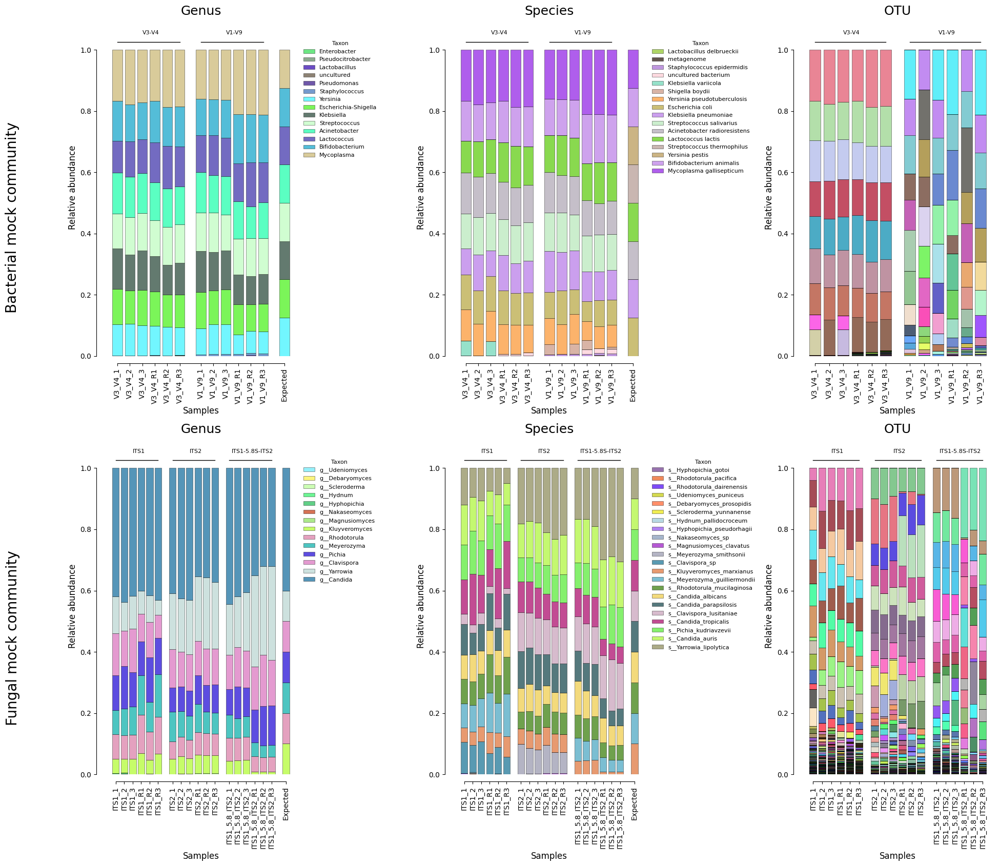

In [753]:
import warnings 
#warnings.filterwarnings('ignore')
fig, axs = plt.subplots(2, 3, figsize=(20, 17))

subplots_coord_y = 0
subplots_coord_x = 0

for at in tqdm(full_data.keys()):
    for taxlevel in full_data[at].keys():
        
        data_tax_df = full_data[at][taxlevel][0]
        
        if '16S' in at:
            subplots_coord_y = 0
            data_tax_df = data_tax_df[['V3_V4_1', 'V3_V4_2', 'V3_V4_3', 'V3_V4_R1', 'V3_V4_R2', 'V3_V4_R3', 'V1_V9_1', 'V1_V9_2', 'V1_V9_3', 'V1_V9_R1', 'V1_V9_R2', 'V1_V9_R3']]
        else: 
            subplots_coord_y = 1
            data_tax_df = data_tax_df[['ITS1_1', 'ITS1_2', 'ITS1_3', 'ITS1_R1', 'ITS1_R2', 'ITS1_R3', 'ITS2_1', 'ITS2_2', 'ITS2_3', 'ITS2_R1', 'ITS2_R2', 'ITS2_R3', 'ITS1_5.8_ITS2_1', 'ITS1_5.8_ITS2_2', 'ITS1_5.8_ITS2_3', 'ITS1_5.8_ITS2_R1', 'ITS1_5.8_ITS2_R2', 'ITS1_5.8_ITS2_R3']]
            
        
        if 'Genus' in taxlevel:
            subplots_coord_x = 0
        if 'Species' in taxlevel:
            subplots_coord_x = 1            
        if 'OTU' in taxlevel:
            subplots_coord_x = 2
        if taxlevel != 'OTU':
            
            data_tax_df = pd.concat([data_tax_df, EXPECTED[at][taxlevel]], axis=1)
            data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)
            data_tax_df = data_tax_df.fillna(0)
        
        all_coords = []
        width = 0.8
        sample_coord = 1 
        c = []
        fst = True
        Color_collection = {}
        
        for i in data_tax_df.index:
            
            Color_collection[i] = get_color(Color_collection)
        was_at = ''
        for sample in data_tax_df.columns:


            at_type = '_'.join(sample.split('_')[:-1])
            
            #if at_type != was_at:

                #sample_coord += .5
        #    print(at_type)
            bottom = 0
            all_coords.append(sample_coord)
            
            for otu in data_tax_df.index:
                if fst == True:

                    axs[subplots_coord_y][subplots_coord_x].bar(sample_coord, 
                                  data_tax_df[sample][otu], 
                                  width, 
                                  label=otu, 
                                  bottom=bottom,
                                  edgecolor='black',
                                  linewidth=0.4, 
                                  alpha=.7,
                                  color=Color_collection[otu])
                else:
                    axs[subplots_coord_y][subplots_coord_x].bar(sample_coord, 
                                  data_tax_df[sample][otu], 
                                  width, 
                                  bottom=bottom,
                                  edgecolor='black',
                                  alpha=.7,
                                  linewidth=0.4, 
                                  color=Color_collection[otu])
                    
                bottom += data_tax_df[sample][otu]
            #print(sample_coord)
            if sample_coord % 6 == 0 or (sample_coord-0.7) % 6 == 0 or (sample_coord-1.4) % 6 == 0:
                sample_coord += .7   
            sample_coord += 1
             
            fst = False
            was_at = at_type#.copy()

        axs[subplots_coord_y][subplots_coord_x].set_ylim(0, 1.1)
       # if 'ITS' in at: axs[subplots_coord_y][subplots_coord_x].set_xlim(-0.8, sample_coord + 2)
     #   else: axs[subplots_coord_y][subplots_coord_x].set_xlim(-0.8, sample_coord + 0.8)
    
        if taxlevel != 'OTU':
            
            axs[subplots_coord_y][subplots_coord_x].legend(fontsize=8, bbox_to_anchor=(1, .95), title='Taxon', title_fontsize=8, frameon=False)
            #legend.get_title().set_fontsize('8')
        axs[subplots_coord_y][subplots_coord_x].set_xticks(all_coords, data_tax_df.columns, fontsize=7)
        axs[subplots_coord_y][subplots_coord_x].set_ylabel('Relative abundance', fontsize=12)
        axs[subplots_coord_y][subplots_coord_x].set_xlabel('Samples', fontsize=12)
        
        axs[subplots_coord_y][subplots_coord_x].set_title(taxlevel, fontsize=18)
        sns.despine(offset=10, trim=True, ax=axs[subplots_coord_y][subplots_coord_x])
        
        axs[subplots_coord_y][subplots_coord_x].set_xticklabels(data_tax_df.columns, rotation=90)
        
for idxx in range(len(full_data[at].keys())):
    
    axs[0][idxx].text(3, 1.05, 'V3-V4', fontsize=8)
    axs[0][idxx].plot([1, 6], [1.025, 1.025], linewidth=1, color='black')
    axs[0][idxx].text(2+6+0.7+1, 1.05, 'V1-V9', fontsize=8)
    axs[0][idxx].plot([7+0.7, 12+0.7], [1.025, 1.025], linewidth=1, color='black')


    axs[1][idxx].text(3, 1.05, 'ITS1', fontsize=8)
    axs[1][idxx].plot([1, 6], [1.025, 1.025], linewidth=1, color='black')
    axs[1][idxx].text(2+7+0.7, 1.05, 'ITS2', fontsize=8)
    axs[1][idxx].plot([7+0.7, 12+0.7], [1.025, 1.025], linewidth=1, color='black')

    axs[1][idxx].text(1.5+7+5.5+0.7, 1.05, 'ITS1-5.8S-ITS2', fontsize=8)
    axs[1][idxx].plot([13+0.7*2, 18+0.7*2], [1.025, 1.025], linewidth=1, color='black')

axs[0][0].text(-8, 0.15, 'Bacterial mock community', fontsize=20, rotation=90)
axs[1][0].text(-12, 0.17, 'Fungal mock community', fontsize=20, rotation=90)

plt.tight_layout()
plt.savefig('VIZ/PIKE_fig2.pdf', bbox_inches='tight')
plt.savefig('VIZ/PIKE_fig2.png', dpi=800, bbox_inches='tight')
plt.show()

In [ ]:
73 954 295

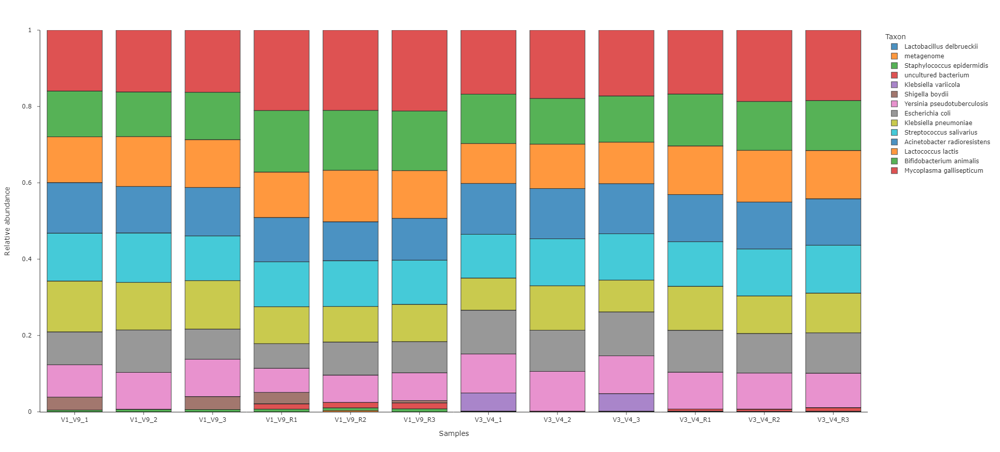

In [654]:
import plotly.express as px
import plotly.subplots as sp

data_tax_df = full_data['16S']['Species'][0]
#data_tax_df = data_tax_df[['ITS1_1', 'ITS1_2', 'ITS1_3', 'ITS1_R1', 'ITS1_R2', 'ITS1_R3', 'ITS2_1', 'ITS2_2', 'ITS2_3', 'ITS2_R1', 'ITS2_R2', 'ITS2_R3', 'ITS1_5.8_ITS2_1', 'ITS1_5.8_ITS2_2', 'ITS1_5.8_ITS2_3', 'ITS1_5.8_ITS2_R1', 'ITS1_5.8_ITS2_R2', 'ITS1_5.8_ITS2_R3']]
data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1).T#[np.sort(data_tax_df.columns)]

fig = px.bar(data_tax_df, 
             x=data_tax_df.index, 
             y=data_tax_df.columns,
             width=700, 
             height=900, 
            # color=data_tax_df.index,
             labels={'value': 'Relative abundance', 'index':'Samples'}, 
             template='simple_white',)
            # color_discrete_map=Color_collection)
fig.update_layout(yaxis_range=[0, 1], legend_title_text='Taxon')#, legend_title_side='top center')
fig.update_traces(marker_line_width=1.1, marker_line_color='#202020', opacity=0.8)
fig.update_yaxes(ticksuffix = "  ")
#fig.update_xaxes(range=[-1, len(otu_tab_viz.T)+0.2], autorangeoptions_clipmax=len(data_tax_df.T))

#fig.update_layout(showlegend=False)

#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.pdf")
#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.png", scale=3)
fig.show()

In [743]:
data_tax_df.columns

Index(['ITS1_1', 'ITS1_2', 'ITS1_3', 'ITS1_R1', 'ITS1_R2', 'ITS1_R3', 'ITS2_1',
       'ITS2_2', 'ITS2_3', 'ITS2_R1', 'ITS2_R2', 'ITS2_R3', 'ITS1_5.8_ITS2_1',
       'ITS1_5.8_ITS2_2', 'ITS1_5.8_ITS2_3', 'ITS1_5.8_ITS2_R1',
       'ITS1_5.8_ITS2_R2', 'ITS1_5.8_ITS2_R3'],
      dtype='object')

### TEST POOL

In [2579]:
amplicon_type = 'V3_V4_2023_04_05_all_data2' #IT WAS PARAMETRIC
amplicon_type = 'V3_V4_2023_04_05_all_data_ordinary_umap'
#amplicon_type = 'V3_V4_2023_04_09_untrimmed' # no trimm
#amplicon_type = 'V3_V4_2023_04_09_cutnew_new_new' # new trimm
#amplicon_type = 'V3_V4_2023_04_11'
amplicon_type = 'V3_V4_final_version' #guppi_barcode
#amplicon_type = 'V1_V9_final_version' #guppi_barcode
#CHECK K=6 and all 
all_mearged_pool = {}

mearged_otu_table = []
#for amplicon_type in ['ITS1_5.8_ITS2_TEST_OTU_TABLE_20000_k6']:
for amplicon_type in ['V1_V9']:
    for samp in listdir(f'/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/16S/{amplicon_type}/results/'):
        
        opn_res = read_csv(f'/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/16S/{amplicon_type}/results/{samp}/results.tsv', sep='\t', index_col=0)
        count = 0
        mearged_otu_table.append(DataFrame(data=opn_res.values, index=opn_res.index, columns=[samp]))
        
        with open(f'/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/16S/{amplicon_type}/{samp}.fasta', 'w') as opn_fasta:
    
            for line in opn_res.index:
                
                
                opn_fasta.write(f'>{count}_{opn_res["Count"][line]}\n{line}\n')
                count += 1
mearged_otu_table = pd.concat(mearged_otu_table, axis=1).fillna(0)
mearged_otu_table = mearged_otu_table[np.sort(mearged_otu_table.columns)]
all_mearged_pool['16S'] = mearged_otu_table

#__________________________________________________________________________________________________________________________
mearged_otu_table = []

for amplicon_type in ['ITS1_5.8_ITS2_TEST_OTU_TABLE_k6']:
    for samp in listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/POOL_TEST_2024_05_13/{amplicon_type}/results/'):
        
        opn_res = read_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/POOL_TEST_2024_05_13/{amplicon_type}/results/{samp}/results.tsv', sep='\t', index_col=0)
        count = 0
        mearged_otu_table.append(DataFrame(data=opn_res.values, index=opn_res.index, columns=[samp]))
            
        with open(f'//mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/POOL_TEST_2024_05_13/{amplicon_type}/{samp}.fasta', 'w') as opn_fasta:
    
            for line in opn_res.index:
                
                
                opn_fasta.write(f'>{count}_{opn_res["Count"][line]}\n{line}\n')
                count += 1
mearged_otu_table = pd.concat(mearged_otu_table, axis=1).fillna(0)
mearged_otu_table = mearged_otu_table[np.sort(mearged_otu_table.columns)]
all_mearged_pool['ITS'] = mearged_otu_table
#mearged_otu_table.T.to_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/merged_otu_table.tsv',sep='\t')

In [2580]:
output = f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/16S_TAXONOMY'
dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta'
#dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta'

taxonomy_level = 'Genus'
taxonomy_level = 'Species'
taxonomy_level = 'OTU'
full_data_pool = {}

for amplic in all_mearged_pool.keys():

    full_data_pool[amplic] = {}
    
    if 'V' in amplic:
        dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta'
        
    if 'ITS' in amplic:
        dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta'
        
    for taxonomy_level in ['Genus', 'Species', 'OTU']:
        
        data_tax_df, data_tax, blasting_results_df, OTU_decoder = filter_data(output, 
                                                                             dbpath,
                                                                             all_mearged_pool[amplic],
                                                                             taxonomy_level, 
                                                                             identity_filter=95, 
                                                                             cov_lim=60, 
                                                                             evalue_filter=1e-05)
        full_data_pool[amplic][taxonomy_level] = [data_tax_df, data_tax, blasting_results_df, OTU_decoder]
        

The output directory already exists!


Building a new DB, current time: 06/27/2024 07:46:43
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 510508 sequences in 11.1369 seconds.


510508it [00:10, 49321.38it/s]
100%|███████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 13573.80it/s]


The output directory already exists!


Building a new DB, current time: 06/27/2024 07:47:15
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 510508 sequences in 11.4739 seconds.


510508it [00:10, 48738.25it/s]
100%|███████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 18072.90it/s]


The output directory already exists!


Building a new DB, current time: 06/27/2024 07:47:48
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 510508 sequences in 11.4228 seconds.


510508it [00:10, 49788.63it/s]
100%|███████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 16823.80it/s]


The output directory already exists!


Building a new DB, current time: 06/27/2024 07:48:20
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 1039010 sequences in 17.3197 seconds.


1039010it [00:08, 119854.34it/s]
100%|███████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 24291.34it/s]


The output directory already exists!


Building a new DB, current time: 06/27/2024 07:49:39
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 1039010 sequences in 17.1644 seconds.


1039010it [00:12, 81124.88it/s]
100%|███████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 27576.32it/s]


The output directory already exists!


Building a new DB, current time: 06/27/2024 07:51:02
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 1039010 sequences in 17.5463 seconds.


1039010it [00:08, 120533.10it/s]
100%|███████████████████████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 24974.84it/s]


In [557]:
paths = ['/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/16S/V3_V4/pool_V3_V4_k6_150000_reads/',
         '/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/16S/V1_V9/pool_V1_V9_k6_100000_reads/',
         '/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/ITS/ITS1/pool_ITS1_k6_150000_reads/',
         '/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/ITS/ITS2/pool_ITS2_k6_100000_reads/',
         '/mnt/AsusShareI2/RUNS/runs-sonec/pool_pike/ITS/ITS_full/pool_ITS_full_k6_100000_reads/',
        ]
def get_otu_tab(taxtab, otutab):
    
    tax_info = {}
    otucount = 0
    
    for idx in taxtab.index:
        
        tax = ' '.join(taxtab['Species'][idx].split()[:2])
        
        if tax not in tax_info.keys():
            
            tax_info[f'OTU{otucount}_{tax}'] = {}
            
        for samp in otutab.index:
            
            tax_info[f'OTU{otucount}_{tax}'][samp] = otutab[idx][samp]
            
        otucount += 1
    tax_info = DataFrame(tax_info)    
    tax_info = tax_info.T/tax_info.sum(axis=1)
    tax_info = tax_info.assign(m=tax_info.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(tax_info.columns)]

    return tax_info
def get_tab(taxtab, otutab, level):
    tax_info = {}
    otucount = 0
    
    for idx in taxtab.index:
        
        tax = taxtab[level][idx] 
        if level == 'Species':
            tax= ' '.join(taxtab['Species'][idx].split()[:2])
            
        if tax not in tax_info.keys():
            
            tax_info[tax] = {}
            
        for samp in otutab.index:
            if samp not in tax_info[tax]:
                
                tax_info[tax][samp] = 0
                
            tax_info[tax][samp] += otutab[idx][samp]
            
        otucount += 1
    tax_info = DataFrame(tax_info)    
    tax_info = tax_info.T/tax_info.sum(axis=1)
    tax_info = tax_info.assign(m=tax_info.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(tax_info.columns)]
    return tax_info
    
full_data_pool = {}

for path in tqdm(paths):

    samp =  path.split('/')[-3]
    taxtab = read_csv(f'{path}/TAXONOMY/tax_table.tsv', sep='\t', index_col=0)
    otutab = read_csv(f'{path}/merged_otu_table.tsv', sep='\t', index_col=0)

    full_data_pool[samp] = {'Genus' : get_tab(taxtab, otutab, 'Genus'),
                            'Species' : get_tab(taxtab, otutab, 'Species'),
                            'OTU' : get_otu_tab(taxtab, otutab)
                           }
    
    

100%|████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 23.77it/s]


100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [00:10<00:00,  3.41s/it]


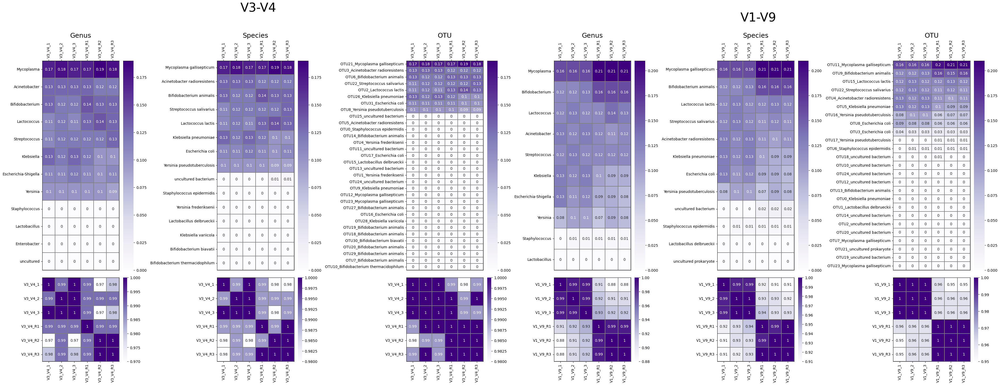

In [590]:

fig, axs = plt.subplots(2, 6, figsize=(25*1.5, 9*1.6), 
                        gridspec_kw={'height_ratios': [1, 0.4]}, constrained_layout=True)
x_coord = 0
for at in ['V3_V4', 'V1_V9']:
    
    for taxlevel in tqdm(['Genus', 'Species', 'OTU']):
        
        data_tax_df = full_data_pool[at][taxlevel]

        data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]
        data_tax_df_viz = data_tax_df[::-1]#[:20]
    
        sns.heatmap(np.round(data_tax_df_viz, 2), 
                    ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                    annot=True)
        axs[0][x_coord].xaxis.tick_top()
        axs[0][x_coord].set_title(taxlevel, fontsize=18)
        axs[0][x_coord].set_xlabel('')
        
        for spine in axs[0][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[0][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
        
        axs[0][x_coord].tick_params(axis='x', labelrotation=90)
        axs[0][x_coord].tick_params(axis='y', labelrotation=360)
    
        
        #matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
       # viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
        viz = np.round(data_tax_df.corr('pearson'), 2)
        
        g = sns.heatmap(viz, 
                    ax=axs[1][x_coord], cmap='Purples', linewidths=.1, linecolor='grey', annot=True)
    
    
        axs[1][x_coord].set_xlabel('')
        axs[1][x_coord].set_ylabel('')
        for spine in axs[1][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[1][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
            
        axs[1][x_coord].tick_params(axis='x', labelrotation=90)

        x_coord += 1
    
axs[0][1].text(1.8, -3.5, 'V3-V4', fontsize=33)
axs[0][4].text(1.8, -2.25, 'V1-V9', fontsize=33)

#plt.tight_layout(w_pad=5)
plt.savefig('VIZ/Pool_test_16S.png', dpi=800, bbox_inches='tight')
plt.savefig('VIZ/Pool_test_16S.pdf', bbox_inches='tight')
plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [00:18<00:00,  6.13s/it]


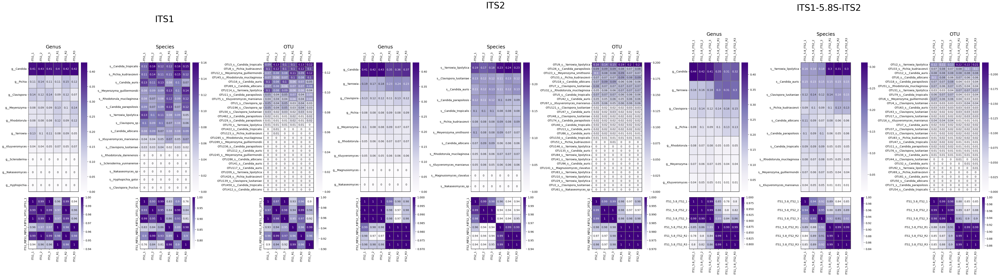

In [592]:

fig, axs = plt.subplots(2, 3*3, figsize=(70*0.74, 19*0.75),
                        gridspec_kw={'height_ratios': [1, 0.4]}, constrained_layout=True)
x_coord = 0
for at in ['ITS1', 'ITS2', 'ITS_full']:
    
    for taxlevel in tqdm(['Genus', 'Species', 'OTU']):
        
        data_tax_df = full_data_pool[at][taxlevel]

        data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]
        data_tax_df_viz = data_tax_df[::-1][:30]
    
        sns.heatmap(np.round(data_tax_df_viz, 2), 
                    ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                    annot=True)
        axs[0][x_coord].xaxis.tick_top()
        axs[0][x_coord].set_title(taxlevel, fontsize=18)
        axs[0][x_coord].set_xlabel('')
        
        for spine in axs[0][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[0][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
        
        axs[0][x_coord].tick_params(axis='x', labelrotation=90)
        axs[0][x_coord].tick_params(axis='y', labelrotation=360)
    
        
        #matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
       # viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
        viz = np.round(data_tax_df.corr('pearson'), 2)
        
        g = sns.heatmap(viz, 
                    ax=axs[1][x_coord], cmap='Purples', linewidths=.1, linecolor='grey', annot=True)
    
    
        axs[1][x_coord].set_xlabel('')
        axs[1][x_coord].set_ylabel('')
        for spine in axs[1][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[1][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
            
        axs[1][x_coord].tick_params(axis='x', labelrotation=90)

        x_coord += 1
    
axs[0][1].text(1.8, -5, 'ITS1', fontsize=33)
axs[0][4].text(1.8, -5, 'ITS2', fontsize=33)
axs[0][7].text(-0.5, -4, 'ITS1-5.8S-ITS2', fontsize=33)

#plt.tight_layout(w_pad=5)
plt.savefig('VIZ/Pool_test_ITS.png', dpi=800, bbox_inches='tight')
plt.savefig('VIZ/Pool_test_ITS.pdf', bbox_inches='tight')
plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.67s/it]


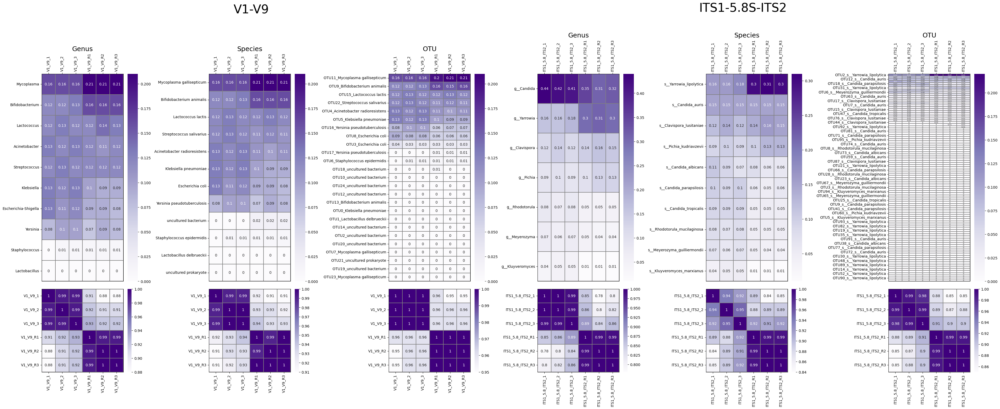

In [582]:

fig, axs = plt.subplots(2, 6, figsize=(12+26, 11+4.5), 
                        gridspec_kw={'height_ratios': [1, 0.4]}, constrained_layout=True)
x_coord = 0
for at in ['V1_V9', 'ITS_full']:
    
    for taxlevel in tqdm(['Genus', 'Species', 'OTU']):
        
        data_tax_df = full_data_pool[at][taxlevel]

        data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]
        data_tax_df_viz = data_tax_df[::-1]#[:20]
        if at == 'ITS_full' and taxlevel == 'OTU':
            
            sns.heatmap(np.round(data_tax_df_viz, 2), 
                        ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                        annot=True, annot_kws={"fontsize":5})
        else:
            sns.heatmap(np.round(data_tax_df_viz, 2), 
                        ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                        annot=True)
        axs[0][x_coord].xaxis.tick_top()
        axs[0][x_coord].set_title(taxlevel, fontsize=18)
        axs[0][x_coord].set_xlabel('')
        
        for spine in axs[0][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[0][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
        
        axs[0][x_coord].tick_params(axis='x', labelrotation=90)
        axs[0][x_coord].tick_params(axis='y', labelrotation=360)
    
        
        #matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
       # viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
        viz = np.round(data_tax_df.corr('pearson'), 2)
        
        g = sns.heatmap(viz, 
                    ax=axs[1][x_coord], cmap='Purples', linewidths=.1, linecolor='grey', annot=True)
    
    
        axs[1][x_coord].set_xlabel('')
        axs[1][x_coord].set_ylabel('')
        for spine in axs[1][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[1][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
            
        axs[1][x_coord].tick_params(axis='x', labelrotation=90)

        x_coord += 1
    
axs[0][1].text(1.8, -3.5, 'V1-V9', fontsize=33)
axs[0][4].text(-0.5, -3, 'ITS1-5.8S-ITS2', fontsize=33)

#plt.tight_layout(w_pad=5)
plt.savefig('VIZ/Pool_test.png', dpi=800, bbox_inches='tight')
plt.savefig('VIZ/Pool_test.pdf', bbox_inches='tight')
plt.show()

In [125]:
taxtab = read_csv(f'{path}//TAXONOMY/tax_table.tsv', sep='\t', index_col=0)
otutab = read_csv(f'{path}//merged_otu_table.tsv', sep='\t', index_col=0)



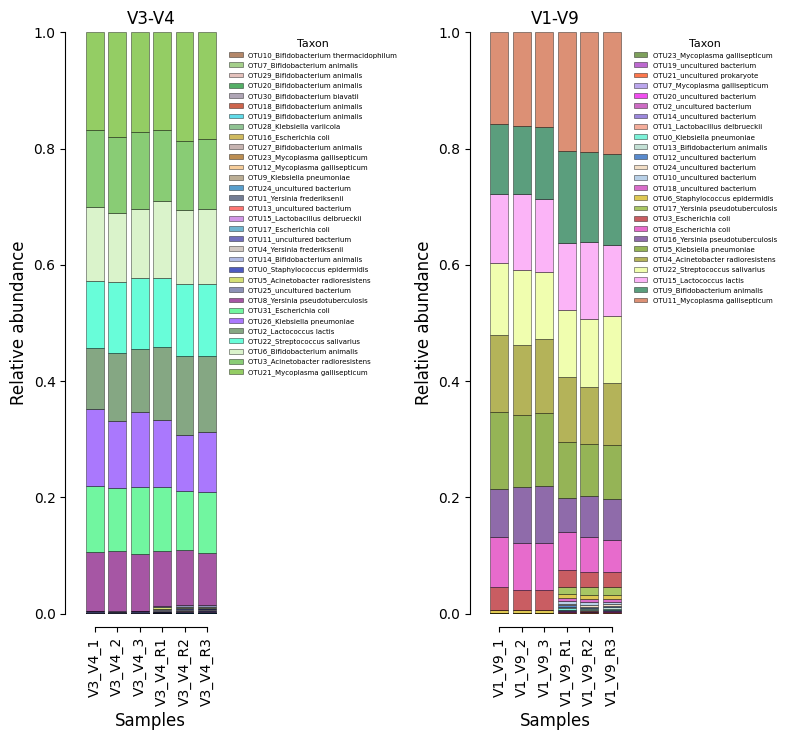

In [594]:
fig, axs = plt.subplots(1, 2, figsize=(8, 7.5))
data_tax_df = full_data_pool['V3_V4']['OTU']

Color_collection = {}      
all_coords = []
width = 0.8
sample_coord = 0 
c = []
fst = True

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)
    
for sample in data_tax_df.columns:
    
    bottom = 0
    all_coords.append(sample_coord)
    
    for otu in data_tax_df.index:
        if fst == True:
            axs[0].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          label=otu, 
                          bottom=bottom,
                          edgecolor='black',
                          linewidth=0.4, 
                          alpha=.7,
                          color=Color_collection[otu])
        else:
            axs[0].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          bottom=bottom,
                          edgecolor='black',
                          alpha=.7,
                          linewidth=0.4, 
                          color=Color_collection[otu])
            
        bottom += data_tax_df[sample][otu]
    fst = False
    sample_coord += 1
axs[0].set_ylim(0, 1.0)
axs[0].legend(fontsize=5, bbox_to_anchor=(1, 1), title='Taxon', title_fontsize=8, frameon=False)
axs[0].set_xticks(all_coords, data_tax_df.columns, fontsize=5)
axs[0].set_ylabel('Relative abundance', fontsize=12)
axs[0].set_xlabel('Samples', fontsize=12)
axs[0].set_title('V3-V4', fontsize=12)
sns.despine(offset=10, trim=True, ax=axs[0])
axs[0].set_xticklabels(data_tax_df.columns, rotation=90)

data_tax_df = full_data_pool['V1_V9']['OTU']

Color_collection = {}      
all_coords = []
width = 0.8
sample_coord = 0 
c = []
fst = True

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)
    
for sample in data_tax_df.columns:
    
    bottom = 0
    all_coords.append(sample_coord)
    
    for otu in data_tax_df.index:
        if fst == True:
            axs[1].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          label=otu, 
                          bottom=bottom,
                          edgecolor='black',
                          linewidth=0.4, 
                          alpha=.7,
                          color=Color_collection[otu])
        else:
            axs[1].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          bottom=bottom,
                          edgecolor='black',
                          alpha=.7,
                          linewidth=0.4, 
                          color=Color_collection[otu])
            
        bottom += data_tax_df[sample][otu]
    fst = False
    sample_coord += 1
axs[1].set_ylim(0, 1.0)
axs[1].legend(fontsize=5, bbox_to_anchor=(1, 1), title='Taxon', title_fontsize=8, frameon=False)
axs[1].set_xticks(all_coords, data_tax_df.columns, fontsize=5)
axs[1].set_ylabel('Relative abundance', fontsize=12)
axs[1].set_xlabel('Samples', fontsize=12)
axs[1].set_title('V1-V9', fontsize=12)
sns.despine(offset=10, trim=True, ax=axs[1])
axs[1].set_xticklabels(data_tax_df.columns, rotation=90)

plt.tight_layout()
plt.savefig('VIZ/PIKE_16S_pool_bar.pdf', bbox_inches='tight')
plt.savefig('VIZ/PIKE_16S_pool_bar.png', dpi=800, bbox_inches='tight')
plt.show()

/tmp/ipykernel_23919/1827338212.py:162: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



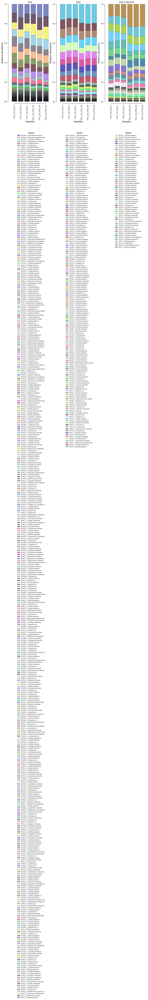

In [269]:
fig, axs = plt.subplots(1, 3, figsize=(14, 10))
data_tax_df = full_data_pool['ITS1']['OTU']

Color_collection = {}      
all_coords = []
width = 0.8
sample_coord = 0 
c = []
fst = True

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)
    
for sample in data_tax_df.columns:
    
    bottom = 0
    all_coords.append(sample_coord)
    
    for otu in data_tax_df.index:
        if fst == True:
            axs[0].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          label=otu, 
                          bottom=bottom,
                          edgecolor='black',
                          linewidth=0.4, 
                          alpha=.7,
                          color=Color_collection[otu])
        else:
            axs[0].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          bottom=bottom,
                          edgecolor='black',
                          alpha=.7,
                          linewidth=0.4, 
                          color=Color_collection[otu])
            
        bottom += data_tax_df[sample][otu]
    fst = False
    sample_coord += 1

data_tax_df = full_data_pool['ITS2']['OTU']

Color_collection = {}      
all_coords = []
width = 0.8
sample_coord = 0 
c = []
fst = True

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)
    
for sample in data_tax_df.columns:
    
    bottom = 0
    all_coords.append(sample_coord)
    
    for otu in data_tax_df.index:
        if fst == True:
            axs[1].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          label=otu, 
                          bottom=bottom,
                          edgecolor='black',
                          linewidth=0.4, 
                          alpha=.7,
                          color=Color_collection[otu])
        else:
            axs[1].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          bottom=bottom,
                          edgecolor='black',
                          alpha=.7,
                          linewidth=0.4, 
                          color=Color_collection[otu])
            
        bottom += data_tax_df[sample][otu]
    fst = False
    sample_coord += 1


data_tax_df = full_data_pool['ITS_full']['OTU']

Color_collection = {}      
all_coords = []
width = 0.8
sample_coord = 0 
c = []
fst = True

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)
    
for sample in data_tax_df.columns:
    
    bottom = 0
    all_coords.append(sample_coord)
    
    for otu in data_tax_df.index:
        if fst == True:
            axs[2].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          label=otu, 
                          bottom=bottom,
                          edgecolor='black',
                          linewidth=0.4, 
                          alpha=.7,
                          color=Color_collection[otu])
        else:
            axs[2].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          bottom=bottom,
                          edgecolor='black',
                          alpha=.7,
                          linewidth=0.4, 
                          color=Color_collection[otu])
            
        bottom += data_tax_df[sample][otu]
    fst = False
    sample_coord += 1


axs[0].set_ylim(0, 1.0)
axs[0].legend(fontsize=7, bbox_to_anchor=(0.9, -0.3), title='Taxon', title_fontsize=12, frameon=False)
axs[0].set_xticks(all_coords, data_tax_df.columns, fontsize=5)
axs[0].set_ylabel('Relative abundance', fontsize=12)
axs[0].set_xlabel('Samples', fontsize=12)
axs[0].set_title('ITS1', fontsize=12)
sns.despine(offset=10, trim=True, ax=axs[0])
axs[0].set_xticklabels(data_tax_df.columns, rotation=90)


axs[1].set_ylim(0, 1.0)
axs[1].legend(fontsize=7, bbox_to_anchor=(0.9, -0.3), title='Taxon', title_fontsize=12, frameon=False)
axs[1].set_xticks(all_coords, data_tax_df.columns, fontsize=5)
axs[1].set_ylabel('Relative abundance', fontsize=12)
axs[1].set_xlabel('Samples', fontsize=12)
axs[1].set_title('ITS2', fontsize=12)
sns.despine(offset=10, trim=True, ax=axs[1])
axs[1].set_xticklabels(data_tax_df.columns, rotation=90)


axs[2].set_ylim(0, 1.0)
axs[2].legend(fontsize=7, bbox_to_anchor=(0.9, -0.3), title='Taxon', title_fontsize=12, frameon=False)
axs[2].set_xticks(all_coords, data_tax_df.columns, fontsize=5)
axs[2].set_ylabel('Relative abundance', fontsize=12)
axs[2].set_xlabel('Samples', fontsize=12)
axs[2].set_title('ITS1-5.8S-ITS2', fontsize=12)
sns.despine(offset=10, trim=True, ax=axs[2])
axs[2].set_xticklabels(data_tax_df.columns, rotation=90)

plt.tight_layout()
plt.savefig('VIZ/PIKE_ITS_pool_bar.pdf', bbox_inches='tight')
plt.savefig('VIZ/PIKE_ITS_pool_bar.png', bbox_inches='tight', dpi=500)
plt.show()

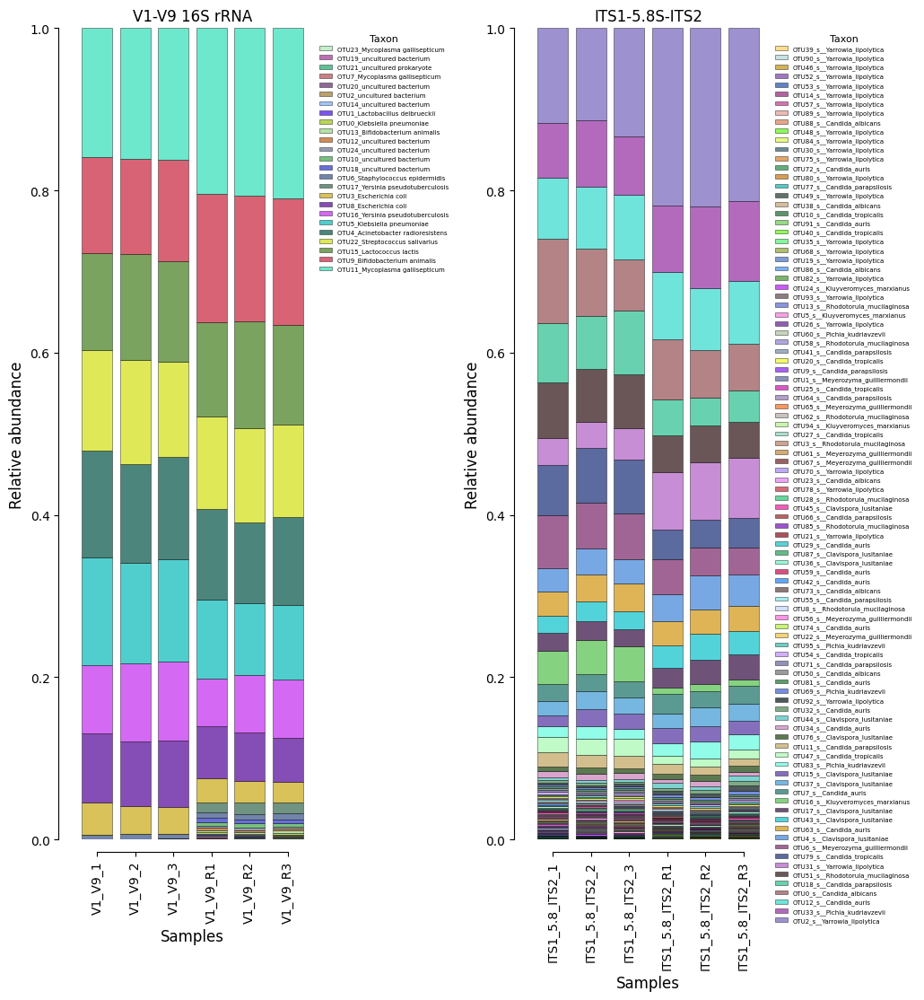

In [598]:
fig, axs = plt.subplots(1, 2, figsize=(8*1.3, 7.5*1.5))
data_tax_df = full_data_pool['V1_V9']['OTU']

Color_collection = {}      
all_coords = []
width = 0.8
sample_coord = 0 
c = []
fst = True

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)
    
for sample in data_tax_df.columns:
    
    bottom = 0
    all_coords.append(sample_coord)
    
    for otu in data_tax_df.index:
        if fst == True:
            axs[0].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          label=otu, 
                          bottom=bottom,
                          edgecolor='black',
                          linewidth=0.4, 
                          alpha=.7,
                          color=Color_collection[otu])
        else:
            axs[0].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          bottom=bottom,
                          edgecolor='black',
                          alpha=.7,
                          linewidth=0.4, 
                          color=Color_collection[otu])
            
        bottom += data_tax_df[sample][otu]
    fst = False
    sample_coord += 1
axs[0].set_ylim(0, 1.0)
axs[0].legend(fontsize=5, bbox_to_anchor=(1, 1), title='Taxon', title_fontsize=8, frameon=False)
axs[0].set_xticks(all_coords, data_tax_df.columns, fontsize=5)
axs[0].set_ylabel('Relative abundance', fontsize=12)
axs[0].set_xlabel('Samples', fontsize=12)
axs[0].set_title('V1-V9 16S rRNA', fontsize=12)
sns.despine(offset=10, trim=True, ax=axs[0])
axs[0].set_xticklabels(data_tax_df.columns, rotation=90)

data_tax_df = full_data_pool['ITS_full']['OTU']

Color_collection = {}      
all_coords = []
width = 0.8
sample_coord = 0 
c = []
fst = True

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)
    
for sample in data_tax_df.columns:
    
    bottom = 0
    all_coords.append(sample_coord)
    
    for otu in data_tax_df.index:
        if fst == True:
            axs[1].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          label=otu, 
                          bottom=bottom,
                          edgecolor='black',
                          linewidth=0.4, 
                          alpha=.7,
                          color=Color_collection[otu])
        else:
            axs[1].bar(sample_coord, 
                          data_tax_df[sample][otu], 
                          width, 
                          bottom=bottom,
                          edgecolor='black',
                          alpha=.7,
                          linewidth=0.4, 
                          color=Color_collection[otu])
            
        bottom += data_tax_df[sample][otu]
    fst = False
    sample_coord += 1
axs[1].set_ylim(0, 1.0)
axs[1].legend(fontsize=5, bbox_to_anchor=(1, 1), title='Taxon', title_fontsize=8, frameon=False)
axs[1].set_xticks(all_coords, data_tax_df.columns, fontsize=5)
axs[1].set_ylabel('Relative abundance', fontsize=12)
axs[1].set_xlabel('Samples', fontsize=12)
axs[1].set_title('ITS1-5.8S-ITS2', fontsize=12)
sns.despine(offset=10, trim=True, ax=axs[1])
axs[1].set_xticklabels(data_tax_df.columns, rotation=90)

plt.tight_layout()
plt.savefig('VIZ/PIKE_fig3.pdf')
plt.savefig('VIZ/PIKE_fig3.png', dpi=800)
plt.show()

100%|███████████████████████████████████████████████████████████████████| 3/3 [00:10<00:00,  3.64s/it]


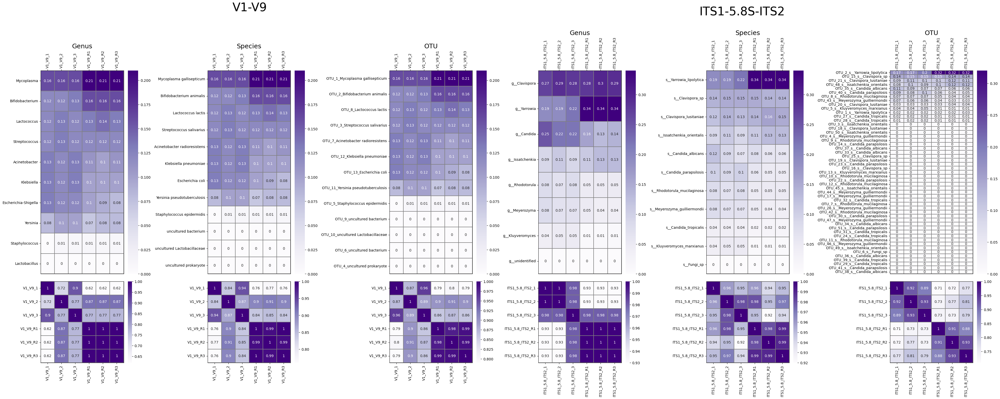

In [2951]:

fig, axs = plt.subplots(2, 6, figsize=(12+27, 11+4.5), 
                        gridspec_kw={'height_ratios': [1, 0.4]}, constrained_layout=True)
x_coord = 0
for at in full_data_pool.keys():
    
    for taxlevel in tqdm(['Genus', 'Species', 'OTU']):
        
        data_tax_df = full_data_pool[at][taxlevel][0]

        data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]
        data_tax_df_viz = data_tax_df[::-1]#[:20]
    
        sns.heatmap(np.round(data_tax_df_viz, 2), 
                    ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                    annot=True)
        axs[0][x_coord].xaxis.tick_top()
        axs[0][x_coord].set_title(taxlevel, fontsize=18)
        axs[0][x_coord].set_xlabel('')
        
        for spine in axs[0][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[0][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
        
        axs[0][x_coord].tick_params(axis='x', labelrotation=90)
        axs[0][x_coord].tick_params(axis='y', labelrotation=360)
    
        
        #matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
       # viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
        viz = np.round(data_tax_df.corr('spearman'), 2)
        
        g = sns.heatmap(viz, 
                    ax=axs[1][x_coord], cmap='Purples', linewidths=.1, linecolor='grey', annot=True)
    
    
        axs[1][x_coord].set_xlabel('')
        axs[1][x_coord].set_ylabel('')
        for spine in axs[1][x_coord].spines.values():
            spine.set_visible(True)
        for spine in axs[1][x_coord].spines.values():
            spine.set(visible=True, lw=.8, edgecolor="black")
            
        axs[1][x_coord].tick_params(axis='x', labelrotation=90)

        x_coord += 1
    
axs[0][1].text(1.8, -3.5, 'V1-V9', fontsize=33)
axs[0][4].text(-0.5, -3, 'ITS1-5.8S-ITS2', fontsize=33)

#plt.tight_layout(w_pad=5)
plt.savefig('VIZ/Pool_test.png', dpi=800, bbox_inches='tight')
plt.savefig('VIZ/Pool_test.pdf', bbox_inches='tight')
plt.show()

## External data

In [8]:
mearged_otu_table = []
#for amplicon_type in ['ITS1_5.8_ITS2_TEST_OTU_TABLE_20000_k6']:
for amplicon_type in ['Pike_out']:
    for samp in listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/{amplicon_type}/results/'):
        
        opn_res = read_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/{amplicon_type}/results/{samp}/results.tsv', sep='\t', index_col=0)
        count = 0
        mearged_otu_table.append(DataFrame(data=opn_res.values, index=opn_res.index, columns=[samp]))
        
        with open(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/{amplicon_type}/{samp}.fasta', 'w') as opn_fasta:
    
            for line in opn_res.index:
                
                
                opn_fasta.write(f'>{count}_{opn_res["Count"][line]}\n{line}\n')
                count += 1
mearged_otu_table = pd.concat(mearged_otu_table, axis=1).fillna(0)
mearged_otu_table = mearged_otu_table[np.sort(mearged_otu_table.columns)]


In [9]:
output = f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/16S_TAXONOMY'
dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta'
#dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta'

taxonomy_level = 'Genus'
taxonomy_level = 'Species'
taxonomy_level = 'OTU'
full_data_external = {}
   
for taxonomy_level in ['Genus', 'Species', 'OTU']:
    
    data_tax_df, data_tax, blasting_results_df, OTU_decoder = filter_data(output, 
                                                                         dbpath,
                                                                         mearged_otu_table,
                                                                         taxonomy_level, 
                                                                         identity_filter=95, 
                                                                         cov_lim=60, 
                                                                         evalue_filter=1e-05)
    full_data_external[taxonomy_level] = [data_tax_df, data_tax, blasting_results_df, OTU_decoder]

The output directory already exists!


Building a new DB, current time: 07/09/2024 09:14:01
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 510508 sequences in 10.3404 seconds.




510508it [00:06, 75905.64it/s]
100%|███████████████████████████████████████████████████████████████████████████| 1939/1939 [00:00<00:00, 6743.96it/s]


The output directory already exists!


Building a new DB, current time: 07/09/2024 09:42:11
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 510508 sequences in 11.3619 seconds.




510508it [00:06, 76351.51it/s]
100%|███████████████████████████████████████████████████████████████████████████| 1939/1939 [00:00<00:00, 6342.60it/s]


The output directory already exists!


Building a new DB, current time: 07/09/2024 10:12:12
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 510508 sequences in 11.5508 seconds.




510508it [00:06, 81386.83it/s]
100%|███████████████████████████████████████████████████████████████████████████| 1939/1939 [00:00<00:00, 6121.21it/s]


In [ ]:
cm = sns.clustermap(clr(data_tax_df+0.0001), 
                    metric='braycurtis',
                    method='complete',
                    yticklabels=True,
                    xticklabels=True, 
                    dendrogram_ratio=0.1,
                    col_cluster=True,
                    row_cluster=True,
                    cmap='viridis', 
                    figsize=(8, 9),
                    cbar_pos=(0.95, 0.45, .005, .5),
                  #  linewidths=.000001, linecolor='white'
                   )
plt.setp(cm.ax_heatmap.yaxis.get_majorticklabels(), fontsize=4)
plt.setp(cm.ax_heatmap.xaxis.get_majorticklabels(), fontsize=4)
hm = cm.ax_heatmap.get_position()

start = 0

for i in range(len(data_tax_df.index)):
    
    cm.ax_heatmap.axhline(y=start, linewidth=.4, color="grey")
    start += 1

cm.ax_heatmap.axhline(y=start-0.01, linewidth=.4, color="grey")


start = 0

for i in range(len(data_tax_df.columns)):
    
    cm.ax_heatmap.axvline(x=start, linewidth=.4, color="grey")
    if start/6 - start//3 == 0:
        cm.ax_heatmap.axvline(x=start, linewidth=.4, color="white")
    start += 1
cm.ax_heatmap.axvline(x=start-0.01, linewidth=.4, color="grey")

#plt.savefig(f'/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/mycoplasma_2023_12_13/mycoplasma_16s_v3-v4/heatmap.png', dpi=800)
plt.show()

In [1687]:
mearged_otu_table.to_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/phylodata/otu_table.tsv', sep='\t')

In [1688]:
blasting_results_df.to_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/phylodata/tax_table.tsv', sep='\t')

In [10]:
otu_table = mearged_otu_table.copy()
otu_table = otu_table.loc[blasting_results_df.index]
otu_nums = []
count = 0

with open('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/phylodata/otu.fasta', 'w') as opn_fasta:
    
    for line in otu_table.index:
        
        opn_fasta.write(f'>OTU_{count}\n{line}\n')
        otu_nums.append(f'OTU_{count}')
        count += 1

In [11]:
otu_table['otu_nums'] = otu_nums
otu_table = otu_table.set_index('otu_nums')

In [12]:
sample_data = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/SraRunTable.txt', index_col=0)

otu_table = otu_table.rename(sample_data['Sample Name'].to_dict(), axis=1)

In [13]:
tax_table = blasting_results_df.copy()
tax_table['otu_nums'] = otu_nums
tax_table = tax_table.set_index('otu_nums')

In [14]:
sample_data = sample_data.set_index('Sample Name')

###### 

In [43]:
sample_data[sample_data.Platform == 'OXFORD_NANOPORE']

,Assay Type,AvgSpotLen,Bases,BioProject,Biosample_attributes,BioSample,BioSampleModel,Bytes,Center Name,Collection_Date,...,LibrarySelection,LibrarySource,Organism,Platform,ReleaseDate,create_date,version,samp_size,Sample Name,SRA Study
Run,,,,,,,,,,,,,,,,,,,,,
SRR23176478,AMPLICON,1436,60718900,PRJNA925180,biological repilcate 1,SAMN32783217,Metagenome or environmental,52271980,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,soil metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,52,HS_ontR9.4.1_replicate1,SRP418548
SRR23176479,AMPLICON,1419,59608360,PRJNA925180,biological repilcate 3,SAMN32783216,Metagenome or environmental,51354818,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,lake water metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,51,NW_ontR9.4.1_replicate3,SRP418548
SRR23176482,AMPLICON,1419,59819229,PRJNA925180,biological repilcate 1,SAMN32783214,Metagenome or environmental,51529361,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,lake water metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,49,NW_ontR9.4.1_replicate1,SRP418548
SRR23176490,AMPLICON,1444,63078839,PRJNA925180,biological repilcate 2,SAMN32783206,Metagenome or environmental,54372301,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,synthetic metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,41,S1_ontR9.4.1_replicate2,SRP418548
SRR23176503,AMPLICON,1442,78863285,PRJNA925180,biological repilcate 3,SAMN32783195,Metagenome or environmental,65685277,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,freshwater metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,30,YW_ontR10.4.1_replicate3,SRP418548
SRR23176504,AMPLICON,1443,80901480,PRJNA925180,biological repilcate 2,SAMN32783194,Metagenome or environmental,67279105,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,freshwater metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,29,YW_ontR10.4.1_replicate2,SRP418548
SRR23176506,AMPLICON,1455,85862816,PRJNA925180,biological repilcate 3,SAMN32783192,Metagenome or environmental,71077336,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,synthetic metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,27,S2_ontR10.4.1_replicate3,SRP418548
SRR23176509,AMPLICON,1458,84907446,PRJNA925180,biological repilcate 3,SAMN32783189,Metagenome or environmental,70395783,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,synthetic metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,24,S1_ontR10.4.1_replicate3,SRP418548
SRR23176514,AMPLICON,1468,84862991,PRJNA925180,biological repilcate 2,SAMN32783185,Metagenome or environmental,70283532,HUAZHONG AGRICULTURAL UNIVERSITY,2022-07,...,PCR,METAGENOMIC,synthetic metagenome,OXFORD_NANOPORE,2023-09-18T00:00:00Z,2023-01-21T08:52:00Z,1,20,Zymo_ontR10.4.1_replicate2,SRP418548


In [1725]:
otu_table.T.to_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/phylodata/otu_table.tsv', sep='\t')
tax_table.to_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/phylodata/tax_table.tsv', sep='\t')
sample_data.to_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/phylodata/sample_data.tsv', sep='\t')

In [16]:
sample_data = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/R10/SraRunTable.txt', index_col=0)
#sample_data = sample_data.loc[otu_tab_viz.index]

In [ ]:
sample_data

In [17]:
otu_tab_viz = full_data_external['Species'][0].T
otu_tab_viz['Sample Name'] = sample_data['Sample Name']
otu_tab_viz = otu_tab_viz.set_index('Sample Name')

otu_tab_viz = otu_tab_viz.loc[np.sort(otu_tab_viz.index)]

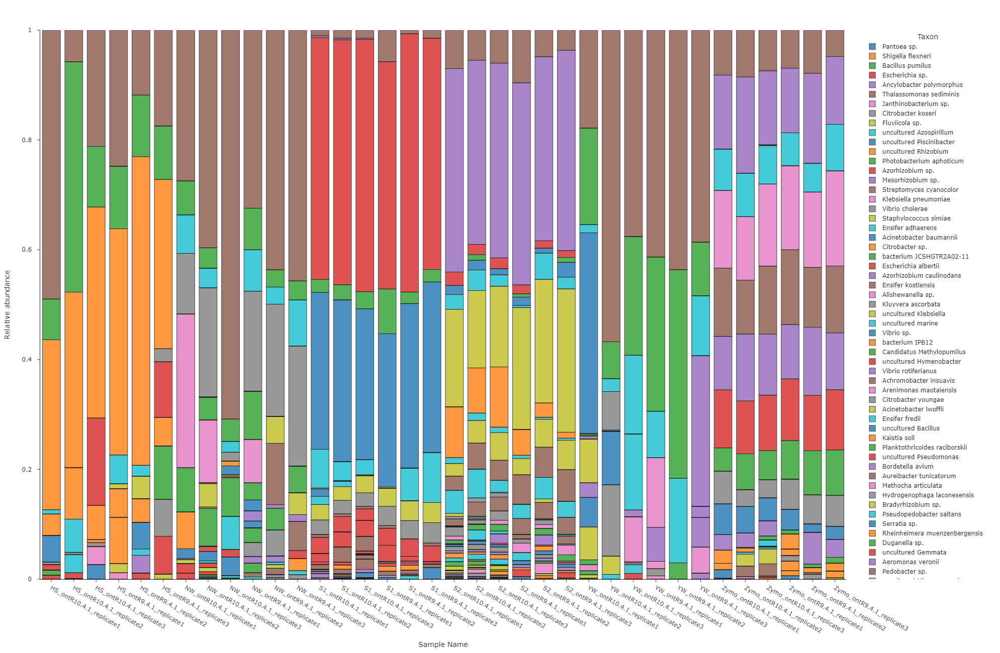

In [2307]:
import plotly.express as px
import plotly.subplots as sp

fig = px.bar(otu_tab_viz, 
             x=otu_tab_viz.index, 
             y=otu_tab_viz.columns,
             width=1000, 
             height=1300, 
            # color=data_tax_df.index,
             labels={'value': 'Relative abundance', 'index':'Samples'}, 
             template='simple_white',)
            # color_discrete_map=Color_collection)
fig.update_layout(yaxis_range=[0, 1], legend_title_text='Taxon', legend_title_side='top center')
fig.update_traces(marker_line_width=1.1, marker_line_color='#202020', opacity=0.8)
fig.update_yaxes(ticksuffix = "  ")
#fig.update_xaxes(range=[-1, len(otu_tab_viz.T)+0.2], autorangeoptions_clipmax=len(data_tax_df.T))

#fig.update_layout(showlegend=False)

#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.pdf")
#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.png", scale=3)
fig.show()

In [18]:
subset =  sample_data[sample_data['Sample Name'].str.contains('Zymo')]
r10 = subset[subset['Sample Name'].str.contains("R10")].index
r9 = subset[subset['Sample Name'].str.contains("R9")].index

100%|███████████████████████████████████████████████████████████████████| 3/3 [01:39<00:00, 33.23s/it]


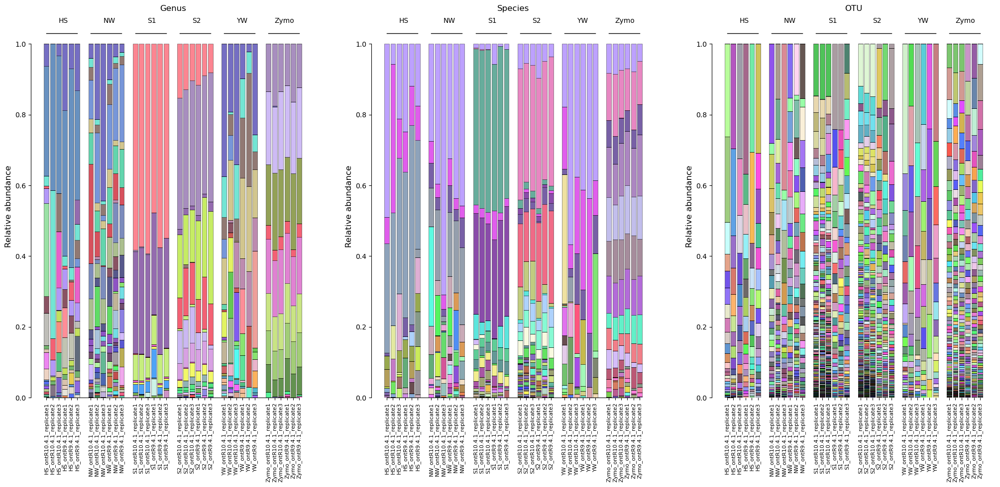

In [2945]:
fig, axs = plt.subplots(1, 3, figsize=(25, 10))
coordx = 0

for taxlevel in tqdm(['Genus', 'Species', 'OTU']):

    otu_tab_viz = full_data_external[taxlevel][0].T
    otu_tab_viz['Sample Name'] = sample_data['Sample Name']
    otu_tab_viz = otu_tab_viz.set_index('Sample Name')
    otu_tab_viz = otu_tab_viz.loc[np.sort(otu_tab_viz.index)]

    data_tax_df = otu_tab_viz.T
    
    Color_collection = {}      
    all_coords = []
    width = 0.8
    c = []
    fst = True
    sample_coord = 0 
    sampcount = 0
    
    for i in data_tax_df.index:
        
        Color_collection[i] = get_color(Color_collection)

    samp_count = 0
    sample_start = 0
    
    for sample in data_tax_df.columns:
        
        bottom = 0
        all_coords.append(sample_coord)
        
        for otu in data_tax_df.index:
            if fst == True:
                axs[coordx].bar(sample_coord, 
                              data_tax_df[sample][otu], 
                              width, 
                              label=otu, 
                              bottom=bottom,
                              edgecolor='black',
                              linewidth=0.4, 
                              alpha=.7,
                              color=Color_collection[otu])
            else:
                axs[coordx].bar(sample_coord, 
                              data_tax_df[sample][otu], 
                              width, 
                              bottom=bottom,
                              edgecolor='black',
                              alpha=.7,
                              linewidth=0.4, 
                              color=Color_collection[otu])
            
            bottom += data_tax_df[sample][otu]
        fst = False
        c.append(sample_coord)
        sampcount += 1
        
        if sampcount%6 == 0:

            sns.lineplot(x=[sample_start, sample_coord], 
                         y=[1.03, 1.03], linewidth=1, 
                         color='black', ax=axs[coordx], 
                         legend=False)
            if 'Zymo' in sample:
                axs[coordx].text(x=sample_coord-4, y=1.06, s=sample.split('_')[0])
            else:
                axs[coordx].text(x=sample_coord-3, y=1.06, s=sample.split('_')[0])
                
            sample_start += sample_start
            sample_coord += 1.2
            sampcount = 0
            sample_start = sample_coord + 1
            
        sample_coord += 1
        
  #  axs[coordx].set_ylim([0, 1])
    axs[coordx].set_title(taxlevel)
    axs[coordx].set_ylabel('Relative abundance', fontsize=12)
    sns.despine(trim=True)
    axs[coordx].set_xticks(c, data_tax_df.columns, rotation=90, fontsize=8)
    coordx += 1

plt.savefig('VIZ/External_taxlevel.pdf', bbox_inches='tight')
plt.savefig('VIZ/External_taxlevel.png', dpi=800, bbox_inches='tight')
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.06s/it]


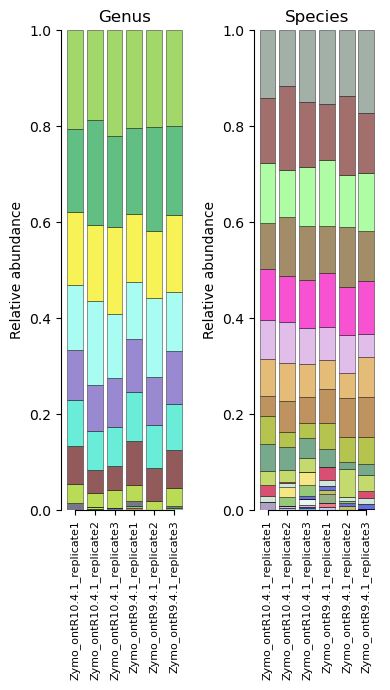

In [2729]:
fig, axs = plt.subplots(1, 2, figsize=(4, 7))
coordx = 0

for taxlevel in tqdm(['Genus', 'Species']):
    
    otu_tab_viz = full_data_external[taxlevel][0].T
    otu_tab_viz['Sample Name'] = sample_data['Sample Name']
    otu_tab_viz = otu_tab_viz.set_index('Sample Name')
    otu_tab_viz = otu_tab_viz.loc[np.sort(otu_tab_viz.index)]
    otu_tab_viz = otu_tab_viz[otu_tab_viz.index.str.contains('Zymo')]
    data_tax_df = otu_tab_viz.T
    data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]

    Color_collection = {}      
    all_coords = []
    width = 0.8
    c = []
    fst = True
    sample_coord = 0 
    sampcount = 0
    
    for i in data_tax_df.index:
        
        Color_collection[i] = get_color(Color_collection)

    samp_count = 0
    sample_start = 0
    
    for sample in data_tax_df.columns:
        
        bottom = 0
        all_coords.append(sample_coord)
        
        for otu in data_tax_df.index:
            if fst == True:
                axs[coordx].bar(sample_coord, 
                              data_tax_df[sample][otu], 
                              width, 
                              label=otu, 
                              bottom=bottom,
                              edgecolor='black',
                              linewidth=0.4, 
                              alpha=.7,
                              color=Color_collection[otu])
            else:
                axs[coordx].bar(sample_coord, 
                              data_tax_df[sample][otu], 
                              width, 
                              bottom=bottom,
                              edgecolor='black',
                              alpha=.7,
                              linewidth=0.4, 
                              color=Color_collection[otu])
            
            bottom += data_tax_df[sample][otu]
        fst = False
        c.append(sample_coord)
        sampcount += 1
        sample_coord += 1
        
    axs[coordx].set_ylim([0, 1])
    axs[coordx].set_title(taxlevel)
    axs[coordx].set_ylabel('Relative abundance')
    axs[coordx].set_xticks(c, data_tax_df.columns, rotation=90, fontsize=8)
    sns.despine(trim=True)

    #if taxlevel != 'OTU':
        #axs[coordx].legend(bbox_to_anchor=(0.5, -1.5), fontsize=5, ncols=2)
    
    coordx += 1
    
plt.tight_layout()
plt.savefig('VIZ/External_Zymo.pdf', bbox_inches='tight')
plt.savefig('VIZ/External_Zymo.png', dpi=800, bbox_inches='tight')
plt.show()

In [19]:
otu_tab = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/REAL_COMPOSITION/Zymo/R10_out/merged_otu_table.tsv', sep='\t', index_col=0)
tax_tab = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/REAL_COMPOSITION/Zymo/R10_out/taxonomy_call_res/tax_table.tsv', sep='\t', index_col=0)
rel_tab = {}
otu_count = 0

for col in otu_tab.columns:
    try:
        
        rel_tab[f"OTU{otu_count}_{tax_tab['Species'][col]}"] = otu_tab[col].to_dict()
        otu_count += 1
        
    except: continue
otu_tab = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/REAL_COMPOSITION/Zymo/R9_out/merged_otu_table.tsv', sep='\t', index_col=0)
tax_tab = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/EXTERNAL/REAL_COMPOSITION/Zymo/R9_out/taxonomy_call_res/tax_table.tsv', sep='\t', index_col=0)
for col in otu_tab.columns:
    try:
        
        rel_tab[f"OTU{otu_count}_{tax_tab['Species'][col]}"] = otu_tab[col].to_dict()
        otu_count += 1
        
    except: continue

rel_tab = DataFrame(rel_tab)
rel_tab = rel_tab.T/rel_tab.sum(axis=1)
rel_tab = rel_tab.rename(columns=sample_data.loc[rel_tab.columns]['Sample Name'].to_dict())

100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [00:04<00:00,  1.37s/it]


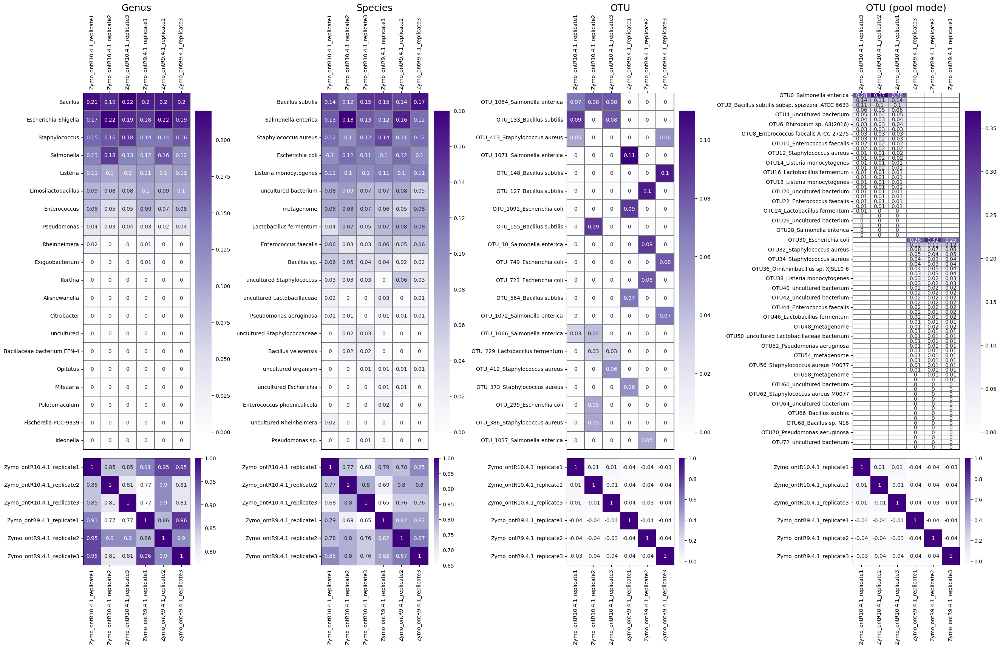

In [20]:

fig, axs = plt.subplots(2, 4, figsize=((12+12)*1.1, (13+2.5)*1.1), 
                        gridspec_kw={'height_ratios': [1, 0.3]}, constrained_layout=True)
x_coord = 0

for taxlevel in tqdm(['Genus', 'Species', 'OTU']):
    
    otu_tab_viz = full_data_external[taxlevel][0].T
    otu_tab_viz['Sample Name'] = sample_data['Sample Name']
    otu_tab_viz = otu_tab_viz.set_index('Sample Name')
    otu_tab_viz = otu_tab_viz.loc[np.sort(otu_tab_viz.index)]
    otu_tab_viz = otu_tab_viz[otu_tab_viz.index.str.contains('Zymo')]
    data_tax_df = otu_tab_viz.T
    data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]
    data_tax_df_viz = data_tax_df[::-1][:20]

    sns.heatmap(np.round(data_tax_df_viz, 2), 
                ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                annot=True)
    axs[0][x_coord].xaxis.tick_top()
    axs[0][x_coord].set_title(taxlevel, fontsize=18)
    axs[0][x_coord].set_xlabel('')
    
    for spine in axs[0][x_coord].spines.values():
        spine.set_visible(True)
    for spine in axs[0][x_coord].spines.values():
        spine.set(visible=True, lw=.8, edgecolor="black")
    
    axs[0][x_coord].tick_params(axis='x', labelrotation=90)


    
    #matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
   # viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
    viz = np.round(data_tax_df.corr('spearman'), 2)
    
    g = sns.heatmap(viz, 
                ax=axs[1][x_coord], cmap='Purples', annot=True)



    axs[1][x_coord].set_xlabel('')
    axs[1][x_coord].set_ylabel('')
    for spine in axs[1][x_coord].spines.values():
        spine.set_visible(True)
    for spine in axs[1][x_coord].spines.values():
        spine.set(visible=True, lw=.8, edgecolor="black")
    x_coord += 1

data_tax_df_viz = rel_tab
sns.heatmap(np.round(data_tax_df_viz, 2), 
            ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
            annot=True)
axs[0][x_coord].xaxis.tick_top()
axs[0][x_coord].set_title('OTU (pool mode)', fontsize=18)
axs[0][x_coord].set_xlabel('')

for spine in axs[0][x_coord].spines.values():
    spine.set_visible(True)
for spine in axs[0][x_coord].spines.values():
    spine.set(visible=True, lw=.8, edgecolor="black")

axs[0][x_coord].tick_params(axis='x', labelrotation=90)



#matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
# viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
viz = np.round(data_tax_df.corr('spearman'), 2)

g = sns.heatmap(viz, 
            ax=axs[1][x_coord], cmap='Purples', annot=True)



axs[1][x_coord].set_xlabel('')
axs[1][x_coord].set_ylabel('')
for spine in axs[1][x_coord].spines.values():
    spine.set_visible(True)
for spine in axs[1][x_coord].spines.values():
    spine.set(visible=True, lw=.8, edgecolor="black")

#plt.tight_layout(w_pad=5)
#plt.savefig('VIZ/Exteranal_zymo_pool.png', dpi=800, bbox_inches='tight')
#plt.savefig('VIZ/Exteranal_zymo_pool.pdf', bbox_inches='tight')
plt.show()

100%|███████████████████████████████████████████████████████████████████| 3/3 [00:06<00:00,  2.04s/it]


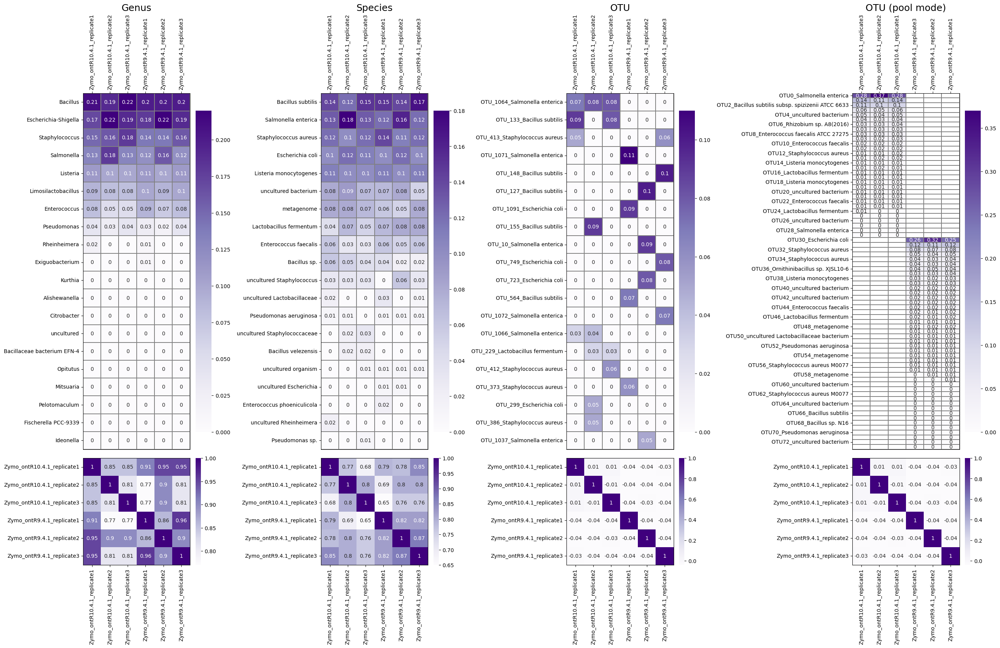

In [2955]:

fig, axs = plt.subplots(2, 4, figsize=((12+12)*1.1, (13+2.5)*1.1), 
                        gridspec_kw={'height_ratios': [1, 0.3]}, constrained_layout=True)
x_coord = 0

for taxlevel in tqdm(['Genus', 'Species', 'OTU']):
    
    otu_tab_viz = full_data_external[taxlevel][0].T
    otu_tab_viz['Sample Name'] = sample_data['Sample Name']
    otu_tab_viz = otu_tab_viz.set_index('Sample Name')
    otu_tab_viz = otu_tab_viz.loc[np.sort(otu_tab_viz.index)]
    otu_tab_viz = otu_tab_viz[otu_tab_viz.index.str.contains('Zymo')]
    data_tax_df = otu_tab_viz.T
    data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]
    data_tax_df_viz = data_tax_df[::-1][:20]

    sns.heatmap(np.round(data_tax_df_viz, 2), 
                ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                annot=True)
    axs[0][x_coord].xaxis.tick_top()
    axs[0][x_coord].set_title(taxlevel, fontsize=18)
    axs[0][x_coord].set_xlabel('')
    
    for spine in axs[0][x_coord].spines.values():
        spine.set_visible(True)
    for spine in axs[0][x_coord].spines.values():
        spine.set(visible=True, lw=.8, edgecolor="black")
    
    axs[0][x_coord].tick_params(axis='x', labelrotation=90)


    
    #matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
   # viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
    viz = np.round(data_tax_df.corr('spearman'), 2)
    
    g = sns.heatmap(viz, 
                ax=axs[1][x_coord], cmap='Purples', annot=True)



    axs[1][x_coord].set_xlabel('')
    axs[1][x_coord].set_ylabel('')
    for spine in axs[1][x_coord].spines.values():
        spine.set_visible(True)
    for spine in axs[1][x_coord].spines.values():
        spine.set(visible=True, lw=.8, edgecolor="black")
    x_coord += 1

data_tax_df_viz = rel_tab
sns.heatmap(np.round(data_tax_df_viz, 2), 
            ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
            annot=True)
axs[0][x_coord].xaxis.tick_top()
axs[0][x_coord].set_title('OTU (pool mode)', fontsize=18)
axs[0][x_coord].set_xlabel('')

for spine in axs[0][x_coord].spines.values():
    spine.set_visible(True)
for spine in axs[0][x_coord].spines.values():
    spine.set(visible=True, lw=.8, edgecolor="black")

axs[0][x_coord].tick_params(axis='x', labelrotation=90)



#matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
# viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
viz = np.round(data_tax_df.corr('spearman'), 2)

g = sns.heatmap(viz, 
            ax=axs[1][x_coord], cmap='Purples', annot=True)



axs[1][x_coord].set_xlabel('')
axs[1][x_coord].set_ylabel('')
for spine in axs[1][x_coord].spines.values():
    spine.set_visible(True)
for spine in axs[1][x_coord].spines.values():
    spine.set(visible=True, lw=.8, edgecolor="black")

#plt.tight_layout(w_pad=5)
plt.savefig('VIZ/Exteranal_zymo_pool.png', dpi=800, bbox_inches='tight')
plt.savefig('VIZ/Exteranal_zymo_pool.pdf', bbox_inches='tight')
plt.show()

In [34]:
otu_tab_viz = full_data_external['Genus'][0].T
otu_tab_viz['Sample Name'] = sample_data['Sample Name']
otu_tab_viz = otu_tab_viz.set_index('Sample Name')
otu_tab_viz = otu_tab_viz.loc[np.sort(otu_tab_viz.index)]
otu_tab_viz = otu_tab_viz[otu_tab_viz.index.str.contains('Zymo_ontR9.4.1')]
otu_tab_viz = otu_tab_viz[otu_tab_viz.columns[otu_tab_viz.sum(axis=0) > 0]]
otu_tab_viz = otu_tab_viz.T
otu_tab_viz= otu_tab_viz.assign(m=otu_tab_viz.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(otu_tab_viz.columns)].T

100%|███████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.25s/it]


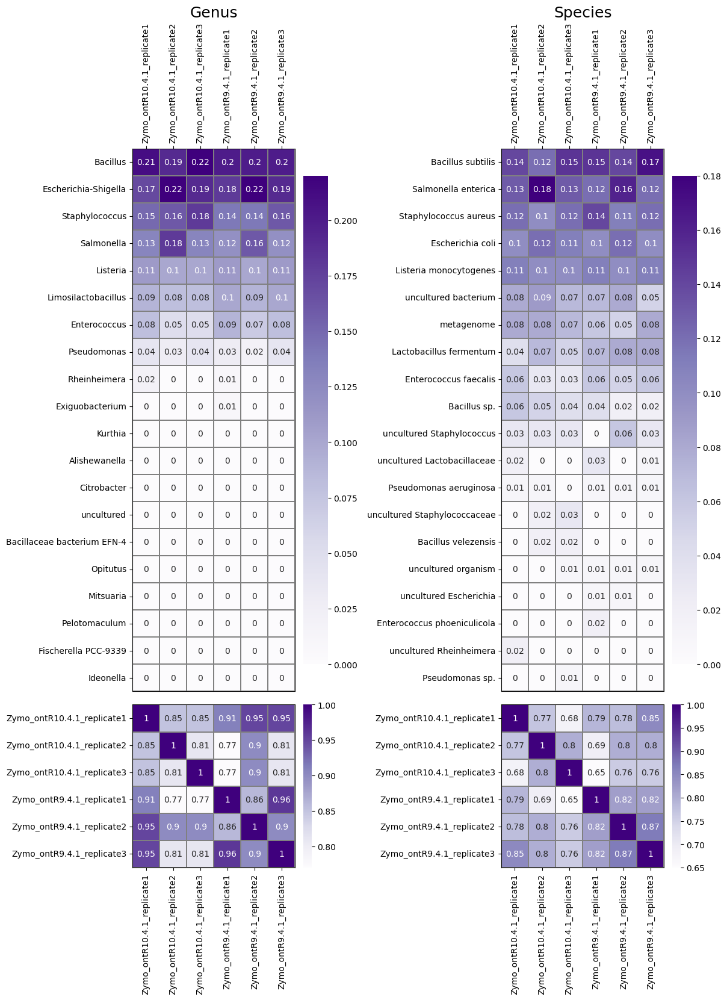

In [2938]:

fig, axs = plt.subplots(2, 2, figsize=(12, 11+5.5), 
                        gridspec_kw={'height_ratios': [1, 0.3]}, constrained_layout=True)
x_coord = 0

for taxlevel in tqdm(['Genus', 'Species']):
    
    otu_tab_viz = full_data_external[taxlevel][0].T
    otu_tab_viz['Sample Name'] = sample_data['Sample Name']
    otu_tab_viz = otu_tab_viz.set_index('Sample Name')
    otu_tab_viz = otu_tab_viz.loc[np.sort(otu_tab_viz.index)]
    otu_tab_viz = otu_tab_viz[otu_tab_viz.index.str.contains('Zymo')]
    data_tax_df = otu_tab_viz.T
    data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]
    data_tax_df_viz = data_tax_df[::-1][:20]

    sns.heatmap(np.round(data_tax_df_viz, 2), 
                ax=axs[0][x_coord], cmap='Purples', linewidths=.1, linecolor='grey',
                annot=True)
    axs[0][x_coord].xaxis.tick_top()
    axs[0][x_coord].set_title(taxlevel, fontsize=18)
    axs[0][x_coord].set_xlabel('')
    
    for spine in axs[0][x_coord].spines.values():
        spine.set_visible(True)
    for spine in axs[0][x_coord].spines.values():
        spine.set(visible=True, lw=.8, edgecolor="black")
    
    axs[0][x_coord].tick_params(axis='x', labelrotation=90)


    
    #matrix = np.triu(np.round(data_tax_df.corr('spearman'), 2))
   # viz = DataFrame(data=np.round(squareform(pdist(clr(data_tax_df.T + 0.0001)), 'euclidean'), 2), index=data_tax_df.columns, columns=data_tax_df.columns)
    viz = np.round(data_tax_df.corr('spearman'), 2)
    
    g = sns.heatmap(viz, 
                ax=axs[1][x_coord], cmap='Purples', linewidths=.1, linecolor='grey', annot=True)


    axs[1][x_coord].set_xlabel('')
    axs[1][x_coord].set_ylabel('')
    for spine in axs[1][x_coord].spines.values():
        spine.set_visible(True)
    for spine in axs[1][x_coord].spines.values():
        spine.set(visible=True, lw=.8, edgecolor="black")
    x_coord += 1


#plt.tight_layout(w_pad=5)
plt.savefig('VIZ/Exteranal_zymo.png', dpi=800, bbox_inches='tight')
plt.savefig('VIZ/Exteranal_zymo.pdf', bbox_inches='tight')
plt.show()

In [42]:
full_data_external['Genus'][2].value_counts('Genus')

Genus
Enterobacter            292
Salmonella              201
Serratia                162
Escherichia-Shigella    128
Pseudomonas             126
                       ... 
Kinneretia                1
Kaistia                   1
Ignavibacterium           1
Ideonella                 1
uncultured organism       1
Name: count, Length: 156, dtype: int64

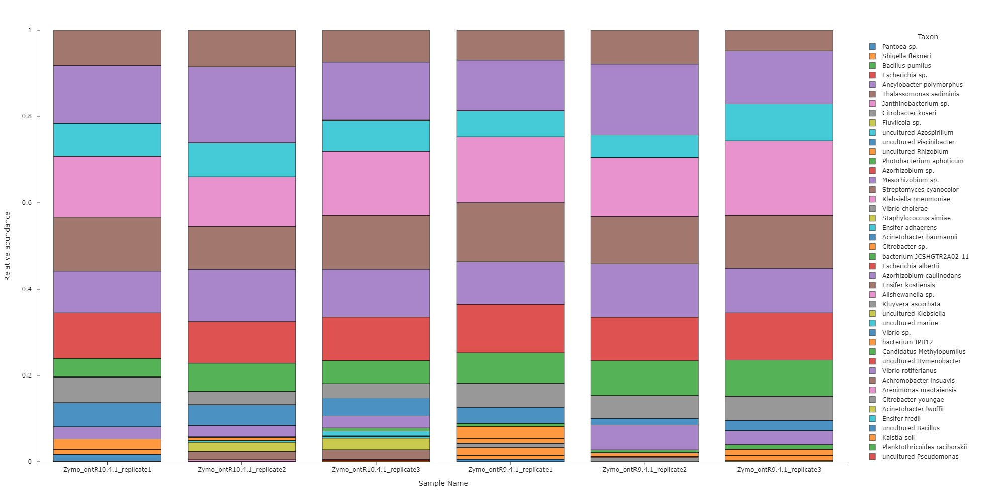

In [2305]:
import plotly.express as px
import plotly.subplots as sp

zymosubset = full_data_pool['Species'][0].T
zymosubset['Sample Name'] = sample_data['Sample Name']
zymosubset = zymosubset.set_index('Sample Name')
zymosubset = zymosubset.loc[np.sort(otu_tab_viz.index)]

zymosubset = zymosubset.loc[zymosubset.index[zymosubset.index.str.contains('Zymo')]]
zymosubset = zymosubset.assign(m=zymosubset.mean(axis=0)).sort_values('m').drop('m', axis=1)
fig = px.bar(zymosubset, 
             x=zymosubset.index, 
             y=zymosubset.columns,
             width=600, 
             height=1000, 
            # color=data_tax_df.index,
             labels={'value': 'Relative abundance', 'index':'Samples'}, 
             template='simple_white')
             #color_discrete_map=Color_collection)
fig.update_layout(yaxis_range=[0, 1], legend_title_text='Taxon', legend_title_side='top center')
fig.update_traces(marker_line_width=1.1, marker_line_color='#202020', opacity=0.8)
fig.update_yaxes(ticksuffix = "  ")
#fig.update_xaxes(range=[-1, len(mearged_otu_table.T)+0.2], autorangeoptions_clipmax=len(data_tax_df.T))

#fig.update_layout(showlegend=False)

#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.pdf")
#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.png", scale=3)
fig.show()

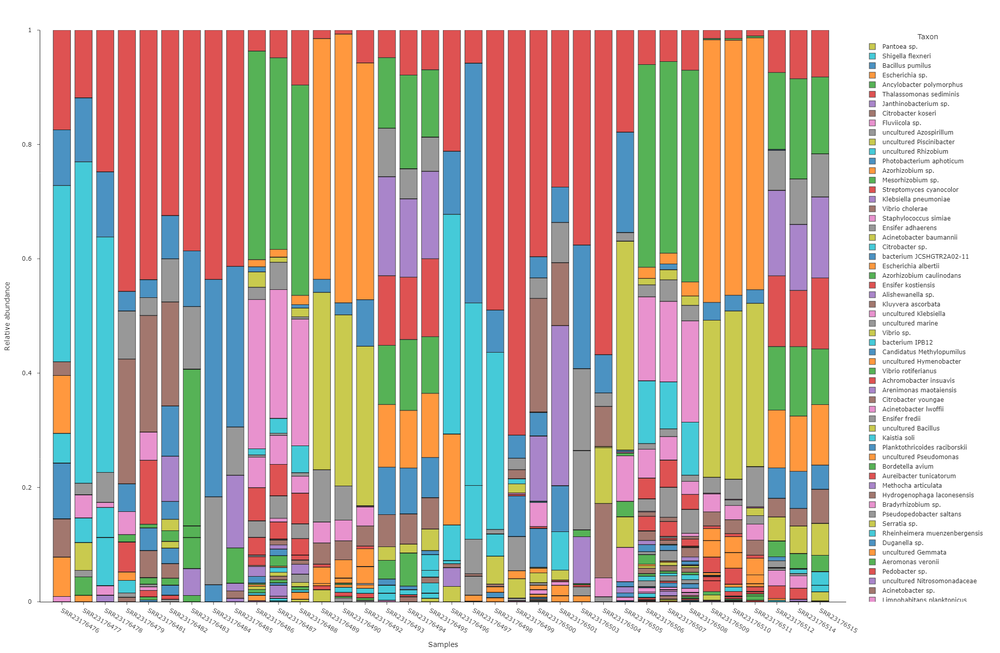

In [1664]:
import plotly.express as px
import plotly.subplots as sp

fig = px.bar(data_tax_df.T, 
             x=data_tax_df.columns, 
             y=data_tax_df.index,
             width=660, 
             height=1300, 
            # color=data_tax_df.index,
             labels={'value': 'Relative abundance', 'index':'Samples'}, 
             template='simple_white',
             color_discrete_map=Color_collection)
fig.update_layout(yaxis_range=[0, 1], legend_title_text='Taxon', legend_title_side='top center')
fig.update_traces(marker_line_width=1.1, marker_line_color='#202020', opacity=0.8)
fig.update_yaxes(ticksuffix = "  ")
fig.update_xaxes(range=[-1, len(mearged_otu_table.T)+0.2], autorangeoptions_clipmax=len(data_tax_df.T))

#fig.update_layout(showlegend=False)

#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.pdf")
#fig.write_image(f"VIZ/V1_V9_pool_{taxonomy_level}.png", scale=3)
fig.show()

In [2463]:
opn_tax_table = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V3_V4_final_version/Pike_results_tax/tax_table.tsv', sep='\t', index_col=0)
kbs = opn_tax_table[opn_tax_table['Genus'] == 'Klebsiella'].index

for i in np.sort(listdir('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V3_V4_final_version')):
    if 'fasta' not in i[-6:]:
        continue
    
    opn_sample = parse(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V3_V4_final_version/{i}', 'fasta')
    
    for line in opn_sample:
        if str(line.seq) in kbs:
            print(i)
         #   print(opn_tax_table.loc[str(line.seq)])
            print(line.seq)
    
    print(i)

V3_V4_1.fasta
GTTTGCTCCCCACGCTTTCGCACCTGAGCGTCAGTCTTTGTCCAGGGGGCCGCCTTCGCCACCGGTATTCCTCCAGATCTCTACGCATTTCACCGCTACACCTGGAATTCTACCCCCCTCTACAAGACTCTAGCCTGCCAGTTTCGAATGCAGTTCCCAGGTTGAGCCCGGGGATTTCACATCCGACTTGACAGACCGCCTGCGTGCGCTTTACGCCCAGTAATTCCGATTAACGCTTGCACCCTCCGTATTACCGCGGCTGCTGGCACGGAGTTAGCCGGTGCTTCTTCTGCGGGTAACGTCAATCGACAAGGTTATTAACCTTAACGCCTTCCTCCCCGCTGAAAGTGCTTTACAACCCGAAGGCCTTCTTCACACACGCGGCATGGCTGCATCAGGCTTGCGCCCATTGTGCAATATTCCCCA
V3_V4_1.fasta
GTTTGCTCCCCACGCTTTCGCACCTGAGCGTCAGTCTTTGTCCAGGGGGCCGCCTTCGCCACCGGTATTCCTCCAGATCTCTACGCATTTCACCGCTACACCTGGAATTCTACCCCCTCTACAAGACTCTAGCCTGCCAGTTTCGAATGCAGTTCCCAGGTTGAGCCCGGGGATTTCACATCCGACTTGACAGACCGCCTGCGTGCGCTTTACGCCCAGTAATTCCGATTAACGCTTGCACCCTCCGTATTACCGCGGCTGCTGGCACGGAGTTAGCCGGTGCTTCTTCTGCGGGTAACGTCAATCGGTGAGGTTATTAACCTCACCGCCTTCCTCCCCGCTGAAAGTGCTTTACAACCCGAAGGCCTTCTTCACACACGCGGCATGGCTGCATCAGGCTTGCGCCCATTGTGCAATATTCCCCA
V3_V4_1.fasta
V3_V4_2.fasta
GTTTGCTCCCCACGCTTTCGCACCTGAGCGTCAGTCTTTGTCCAGGGGGCCGCCTTCGCCACCGGTATTCCTCCAGATCTCTACGCATTTC

In [2440]:
opn_fasta = parse('/mnt/sra_backup/Bacteria_assembly/16S.fasta', 'fasta')
seqcheck = []
with open('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/16S.fasta', 'w') as opn_new_fasta:
    for line in opn_fasta:
        if line.seq in seqcheck: 
            continue
        if 'Klebs' in line.id:
            print(line.seq)
        opn_new_fasta.write(line.format('fasta'))
        seqcheck.append(line.seq)


TTGAAGAGTTTGATCATGGCTCAGATTGAACGCTGGCGGCAGGCCTAACACATGCAAGTCGAGCGGTAGCACAGAGAGCTTGCTCTCGGGTGACGAGCGGCGGACGGGTGAGTAATGTCTGGGAAACTGCCTGATGGAGGGGGATAACTACTGGAAACGGTAGCTAATACCGCATAACGTCGCAAGACCAAAGTGGGGGACCTTCGGGCCTCATGCCATCAGATGTGCCCAGATGGGATTAGCTAGTAGGTGGGGTAACGGCTCACCTAGGCGACGATCCCTAGCTGGTCTGAGAGGATGACCAGCCACACTGGAACTGAGACACGGTCCAGACTCCTACGGGAGGCAGCAGTGGGGAATATTGCACAATGGGCGCAAGCCTGATGCAGCCATGCCGCGTGTGTGAAGAAGGCCTTCGGGTTGTAAAGCACTTTCAGCGGGGAGGAAGGCGTTAAGGTTAATAACCTTGGCGATTGACGTTACCCGCAGAAGAAGCACCGGCTAACTCCGTGCCAGCAGCCGCGGTAATACGGAGGGTGCAAGCGTTAATCGGAATTACTGGGCGTAAAGCGCACGCAGGCGGTCTGTCAAGTCGGATGTGAAATCCCCGGGCTCAACCTGGGAACTGCATTCGAAACTGGCAGGCTAGAGTCTTGTAGAGGGGGGTAGAATTCCAGGTGTAGCGGTGAAATGCGTAGAGATCTGGAGGAATACCGGTGGCGAAGGCGGCCCCCTGGACAAAGACTGACGCTCAGGTGCGAAAGCGTGGGGAGCAAACAGGATTAGATACCCTGGTAGTCCACGCCGTAAACGATGTCGATTTGGAGGTTGTGCCCTTGAGGCGTGGCTTCCGGAGCTAACGCGTTAAATCGACCGCCTGGGGAGTACGGCCGCAAGGTTAAAACTCAAATGAATTGACGGGGGCCCGCACAAGCGGTGGAGCATGTGGTTTAATTCGATGCAACGCGAAGAACCTTACCTGGTCTTGACATCCACAGAA

In [719]:
metadata_df = read_csv('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/POOL_TEST_2024_05_13/ITS1_5.8_ITS2_TEST_OTU_TABLE_20000_k6/work_dir/metadata_df.tsv', sep='\t', index_col=0)

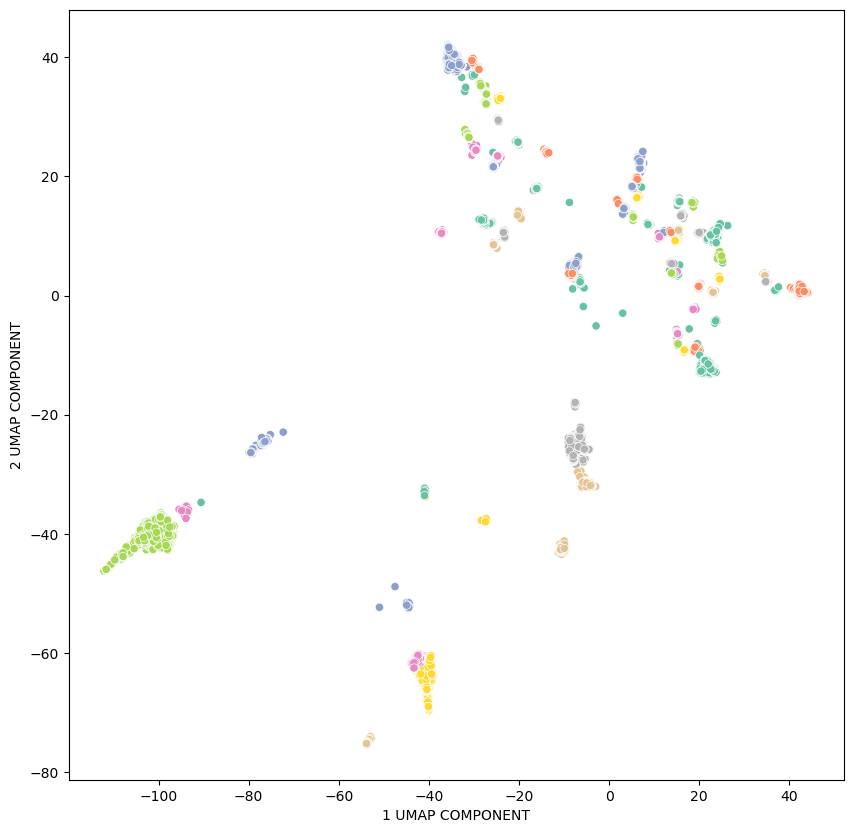

In [720]:
plt.figure(figsize=(10,10))
sns.scatterplot(metadata_df, x='1 UMAP COMPONENT', y='2 UMAP COMPONENT', hue='Clusters', legend=False, palette='Set2')
plt.show()

In [ ]:
Color_collection = {}

for i in data_tax_df.index:
    
    Color_collection[i] = get_color(Color_collection)

In [ ]:
data_tax_df = data_tax_df[['ITS1_1', 'ITS1_2', 'ITS1_3', 'ITS1_R1', 'ITS1_R2', 'ITS1_R3', 'ITS2_1', 'ITS2_2', 'ITS2_3', 'ITS2_R1', 'ITS2_R2', 'ITS2_R3', 'ITS1_5.8_ITS2_1', 'ITS1_5.8_ITS2_2', 'ITS1_5.8_ITS2_3', 'ITS1_5.8_ITS2_R1', 'ITS1_5.8_ITS2_R2', 'ITS1_5.8_ITS2_R3']]

In [ ]:
import plotly.express as px
fig = px.bar(data_tax_df.T, 
             x=data_tax_df.columns, 
             y=data_tax_df.index,
             width=550, 
             height=1000, 
            # color=data_tax_df.index,
             labels={'value': 'Relative abundance', 'index':'Samples'}, 
             template='simple_white',
             color_discrete_map=Color_collection)
fig.update_layout(yaxis_range=[0, 1], legend_title_text='Taxon', legend_title_side='top center')
fig.update_traces(marker_line_width=1.1, marker_line_color='#202020', opacity=0.8)
fig.update_yaxes(ticksuffix = "  ")
fig.update_xaxes(range=[-0.7, 17.7], autorangeoptions_clipmax=len(data_tax_df.T))
#fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide')

fig.update_layout(showlegend=False)

fig.write_image(f"VIZ/ITS_{taxonomy_level}.pdf")
fig.write_image(f"VIZ/ITS_{taxonomy_level}.png", scale=5)
fig.show()

## AMPLICON BIAS ESTIMATION

In [4]:
amplicons_types = ['ITS1_true', 'ITS2_true', 'ITS1_5.8_ITS2_final_version']
all_data_for_ampl_bias_est = {}

for amplicon_type in ['ITS1_5.8_ITS2_final_version', 'V1_V9_final_version']:

    mearged_otu_table = []

    for samp in listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/results/'):
        
        opn_res = read_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/results/{samp}/results.tsv', sep='\t', index_col=0)
        count = 0
        mearged_otu_table.append(DataFrame(data=opn_res.values, index=opn_res.index, columns=[samp]))
        
        with open(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/{samp}.fasta', 'w') as opn_fasta:
    
            for line in opn_res.index:
                
                opn_fasta.write(f'>{count}_{opn_res["Count"][line]}\n{line}\n')
                count += 1


    mearged_otu_table = pd.concat(mearged_otu_table, axis=1).fillna(0)
    all_data_for_ampl_bias_est[amplicon_type] = mearged_otu_table
    
#mearged_otu_table = mearged_otu_table[np.sort(mearged_otu_table.columns)]


In [599]:
amplicon_type = 'V1_V9_final_version'
output = f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/TAXONOMY'
dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta'


data_tax_for_ampl_bias_est = {}

taxonomy_level = 'OTU'

dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta'
data_tax_df, data_tax, blasting_results_df, OTU_decoder = filter_data(output, 
                                 dbpath,
                                 all_data_for_ampl_bias_est[amplicon_type],
                                 taxonomy_level, 
                                 identity_filter=0, 
                                 cov_lim=0, 
                                 evalue_filter=1e-10)

data_tax_for_ampl_bias_est['V1_V9_final_version'] = [data_tax_df, data_tax, blasting_results_df, OTU_decoder]

amplicon_type = 'ITS1_5.8_ITS2_final_version'
output = f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}/TAXONOMY'
taxonomy_level = 'OTU'

dbpath = '/mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta'
data_tax_df, data_tax, blasting_results_df, OTU_decoder= filter_data(output, 
                                 dbpath,
                                 all_data_for_ampl_bias_est[amplicon_type],
                                 taxonomy_level, 
                                 identity_filter=0, 
                                 cov_lim=0, 
                                 evalue_filter=1e-10)

data_tax_for_ampl_bias_est['ITS1_5.8_ITS2_final_version'] = [data_tax_df, data_tax, blasting_results_df, OTU_decoder]

The output directory already exists!


Building a new DB, current time: 08/20/2024 11:29:39
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/METAGENOME/SILVA_138.1_SSURef_NR99_tax_silva.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 510508 sequences in 11.3603 seconds.




510508it [00:07, 72248.73it/s]
100%|██████████████████████████████████████████████████████████████████████████████| 73/73 [00:00<00:00, 28885.30it/s]


The output directory already exists!


Building a new DB, current time: 08/20/2024 11:30:57
New DB name:   /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
New DB title:  /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Sequence type: Nucleotide
Deleted existing Nucleotide BLAST database named /mnt/iscsidisk1/runs/runs-krivonos/PROJECTS/NANOPORE_PROJECT/ITS_AMPLICON/dada_unite.fasta
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 1039010 sequences in 18.8145 seconds.




1039010it [00:09, 114972.17it/s]
100%|████████████████████████████████████████████████████████████████████████████| 230/230 [00:00<00:00, 20270.00it/s]


In [647]:
meata_for_ampl_bias_est = {}

for amplicon_type in ['ITS1_5.8_ITS2_final_version', 'V1_V9_final_version']:
    
    data_tax_df = data_tax_for_ampl_bias_est[amplicon_type][0]
    OTU_decoder = data_tax_for_ampl_bias_est[amplicon_type][3]
    blasting_results_df = data_tax_for_ampl_bias_est[amplicon_type][2]
    saples_pairs = {}
    
    for samp in data_tax_df.columns:
        if 'R' in samp:continue
            
        saples_pairs[samp] = f"{samp[:-1]}R{samp[-1]}"
    lens = {}
    GCs = {}
    relative_abundance = {}
    
    for samp_pair in data_tax_df.columns:
        
        if 'R' in samp_pair:continue
        lens[samp_pair] = {}
        GCs[samp_pair] = {}
        for samp in [samp_pair, saples_pairs[samp_pair]]:
            relative_abundance[samp] = {}
            
            samp_subset = data_tax_df[samp]
            samp_subset = samp_subset[samp_subset!= 0]
            
            for otu in data_tax_df.index: 
                
                otu_seq = OTU_decoder[OTU_decoder.OTU_name == otu].Seq.values[0]
                if 'ITS' in amplicon_type:
                    sp = blasting_results_df['Species'][otu_seq]
                else:
                    sp = blasting_results_df['Genus'][otu_seq]
                if sp not in lens[samp_pair].keys():
                    
                    lens[samp_pair][sp] = []
                    
                lens[samp_pair][sp].append(len(otu_seq))
                
                if sp not in relative_abundance[samp].keys():
                    
                    relative_abundance[samp][sp] = 0
                    
                relative_abundance[samp][sp]+= data_tax_df[samp][otu]
                    
                if sp not in GCs[samp_pair].keys():
                    
                    GCs[samp_pair][sp] = []
                    
                GCs[samp_pair][sp].append((otu_seq.count('G')+otu_seq.count('C'))/len(otu_seq))
                
        for sp in lens[samp_pair].keys():
            
            lens[samp_pair][sp] = np.mean(lens[samp_pair][sp])
            
        for sp in GCs[samp_pair].keys():
            
            GCs[samp_pair][sp] = np.mean(GCs[samp_pair][sp])
        
    relative_abundance = DataFrame(relative_abundance).fillna(0)
    
    lens = DataFrame(lens).fillna(0)
    GCs = DataFrame(GCs).fillna(0)
    uselens = []
    
    for idx in lens.index:
        if 0 in lens.loc[idx].values:continue
        
        uselens.append(idx)
    relative_abundance = relative_abundance.loc[uselens]
    
    difference = {}
    for samp_pair in relative_abundance.columns:
        
        if 'R' in samp_pair:continue
        difference[samp_pair] = relative_abundance[saples_pairs[samp_pair]] - relative_abundance[samp_pair]
    difference = DataFrame(difference)
    
    GCs = GCs.loc[uselens]
    lens = lens.loc[uselens]
    lens = lens[np.sort(lens.columns)]
    difference = difference[np.sort(difference.columns)]
    GCs = GCs[np.sort(GCs.columns)]
    relative_abundance_mean = {}
    relative_abundance_mean['Reamplification free'] = relative_abundance[relative_abundance.columns[relative_abundance.columns.str.contains('R')!=1]].mean(axis=1)
    relative_abundance_mean['Reamplification'] = relative_abundance[relative_abundance.columns[relative_abundance.columns.str.contains('R')]].mean(axis=1)
    relative_abundance_mean = DataFrame(relative_abundance_mean)
    
    meata_for_ampl_bias_est[amplicon_type] = [GCs, lens, difference, relative_abundance_mean]
    

In [648]:
relative_abundance.sum(axis=0)

V1_V9_2     1.0
V1_V9_R2    1.0
V1_V9_1     1.0
V1_V9_R1    1.0
V1_V9_3     1.0
V1_V9_R3    1.0
dtype: float64

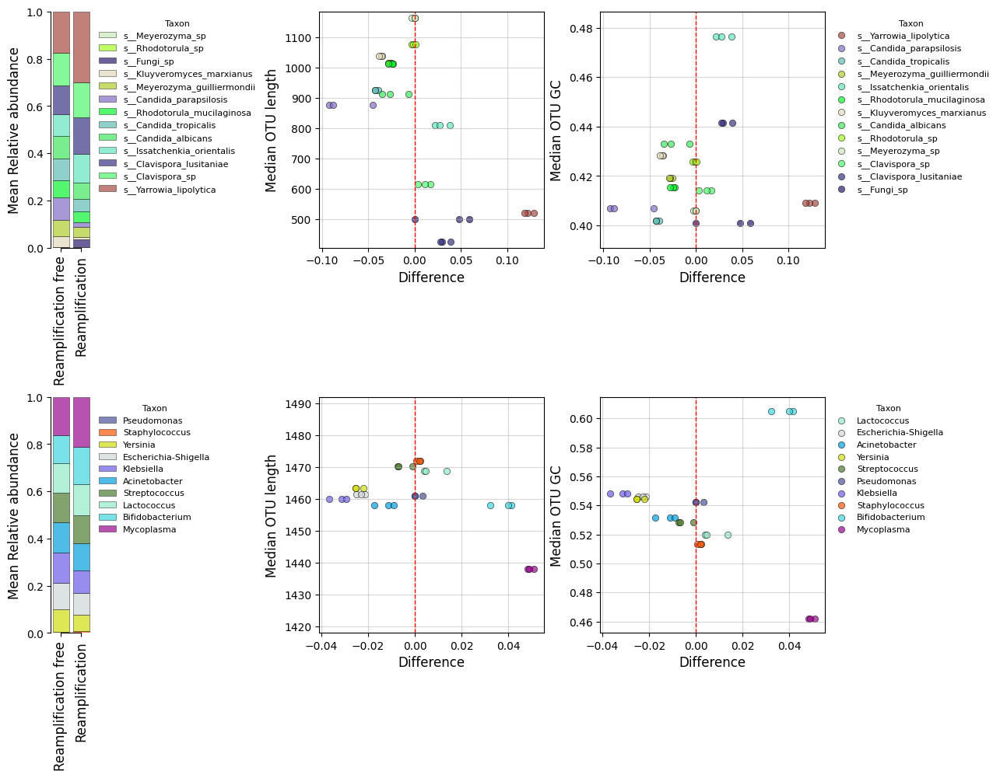

In [649]:
fig, axs = plt.subplots(2, 3, figsize=(14*0.91, 11*0.9),  gridspec_kw={'width_ratios': [0.18, 1, 1]}, constrained_layout=True)
x_count = 0

for amplicon_type in meata_for_ampl_bias_est.keys():
    y_count = 0

    data_tax_df = meata_for_ampl_bias_est[amplicon_type][3]
    data_tax_df = data_tax_df.assign(m=data_tax_df.mean(axis=1)).sort_values('m').drop('m', axis=1)[np.sort(data_tax_df.columns)]

    data_tax_df = data_tax_df[['Reamplification free', 'Reamplification']]

    Color_collection = {}      
    all_coords = []
    width = 0.8
    c = []
    fst = True
    sample_coord = 0 
    sampcount = 0
    
    for i in data_tax_df.index:
        
        Color_collection[i] = get_color(Color_collection)

    samp_count = 0
    sample_start = 0
    
    for sample in data_tax_df.columns:
        
        bottom = 0
        all_coords.append(sample_coord)
        
        for otu in data_tax_df.index:
            if fst == True:
                axs[x_count][y_count].bar(sample_coord, 
                              data_tax_df[sample][otu], 
                              width, 
                              label=otu, 
                              bottom=bottom,
                              edgecolor='black',
                              linewidth=0.4, 
                              alpha=.7,
                              color=Color_collection[otu])
            else:
                axs[x_count][y_count].bar(sample_coord, 
                              data_tax_df[sample][otu], 
                              width, 
                              bottom=bottom,
                              edgecolor='black',
                              alpha=.7,
                              linewidth=0.4, 
                              color=Color_collection[otu])
            
            bottom += data_tax_df[sample][otu]
        fst = False
        c.append(sample_coord)
        sampcount += 1
        sample_coord += 1
        
    axs[x_count][y_count].set_ylim([0, 1])
   # axs[x_count][y_count].text(-2, 1.1, 'A', fontsize=12)
    axs[x_count][y_count].set_ylabel('Mean Relative abundance', fontsize=12)
    axs[x_count][y_count].set_xticks(c, data_tax_df.columns, rotation=90, fontsize=12)
    axs[x_count][y_count].legend(fontsize=8, bbox_to_anchor=(1, 1), title='Taxon', title_fontsize=8, frameon=False)
    sns.despine(trim=True, ax=axs[x_count][y_count])

    y_count += 1
    difference = meata_for_ampl_bias_est[amplicon_type][2]
    lens = meata_for_ampl_bias_est[amplicon_type][1]
    
    for samp in difference.index:
    
        sns.scatterplot(x=difference.loc[samp].values, y=lens.loc[samp].values, ax=axs[x_count][y_count], color=Color_collection[samp], edgecolor='black', linewidth=.5, alpha=0.7)

    axs[x_count][y_count].set_ylabel('Median OTU length', fontsize=12)
    axs[x_count][y_count].set_xlabel('Difference', fontsize=12)
    axs[x_count][y_count].grid(alpha=.5)
    axs[x_count][y_count].plot([0, 0], [np.min(lens.values)-20, np.max(lens.values)+20], color='red', linestyle='dashed', linewidth=1)
    axs[x_count][y_count].set_ylim(np.min(lens.values)-20, np.max(lens.values)+20)
    
    y_count += 1
    GCs = meata_for_ampl_bias_est[amplicon_type][0]
    
    for samp in difference.index:
    
        sns.scatterplot(x=difference.loc[samp].values, y=GCs.loc[samp].values, ax=axs[x_count][y_count], color=Color_collection[samp], edgecolor='black', linewidth=.5, alpha=0.7, label=samp)
    axs[x_count][y_count].plot([0, 0], [np.min(GCs.values)-.01, np.max(GCs.values)+.01], color='red', linestyle='dashed', linewidth=1)
    axs[x_count][y_count].set_ylim(np.min(GCs.values)-.01, np.max(GCs.values)+.01)
    axs[x_count][y_count].set_ylabel('Median OTU GC', fontsize=12)
    axs[x_count][y_count].set_xlabel('Difference', fontsize=12)
    axs[x_count][y_count].grid(alpha=.5)
    axs[x_count][y_count].legend(fontsize=8, bbox_to_anchor=(1, 1), title='Taxon', title_fontsize=8, frameon=False)
    x_count =+ 1
    #if taxlevel != 'OTU':
        #axs[coordx].legend(bbox_to_anchor=(0.5, -1.5), fontsize=5, ncols=2)
plt.savefig('VIZ/Amplification_bias_new.pdf', bbox_inches='tight')
plt.savefig('VIZ/Amplification_bias_new.png', dpi=500, bbox_inches='tight')
plt.show()

In [3018]:
all_len_data_for_ampl_bias_est = {}

for amplicon_type in ['ITS1_5.8_ITS2_final_version', 'V1_V9_final_version']:

    allfa = []
    sample_path = f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{amplicon_type}'
    #sample_path = '/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V1_V9_final_version'
    
    for fa in listdir(f'{sample_path}'):
        if 'fasta' not in fa:
            continue
        opn_fasta = parse(f'{sample_path}/{fa}', 'fasta')
        
        for line in opn_fasta:
            
            allfa.append(str(line.seq))
    allfa = list(set(allfa))
    all_len_data_for_ampl_bias_est[amplicon_type] = allfa

In [ ]:
for amplicon_type in ['ITS1_5.8_ITS2_final_version', 'V1_V9_final_version']:

    data_tax_df = data_tax_for_ampl_bias_est[amplicon_type][0]
    OTU_decoder = data_tax_for_ampl_bias_est[amplicon_type][3]

    

In [3088]:
meata_for_ampl_bias_est = {}

for amplicon_type in ['ITS1_5.8_ITS2_final_version', 'V1_V9_final_version']:
    
    data_tax_df = data_tax_for_ampl_bias_est[amplicon_type][0]
    OTU_decoder = data_tax_for_ampl_bias_est[amplicon_type][3]
    lens = {}
    gc = {}
    #if 
    long = data_tax_df#[data_tax_df.columns[data_tax_df.columns.str.contains('ITS1_5.8')]]
    
    long_R = long[long.columns[long.columns.str.contains('R')]]
    long_O = long[long.columns[long.columns.str.contains('R') != 1]]
    
    for sp in long.index:
        
        lens[sp] = []
        gc[sp] = []
        
        for i in OTU_decoder[OTU_decoder.OTU_name == sp].Seq.values:
            if i not in all_data_for_ampl_bias_est[amplicon_type].index:
                continue
            
            lens[sp].append(len(i))
            gc[sp].append((i.count('C') + i.count('G'))/len(i))
        lens[sp] = np.median(lens[sp])
        gc[sp] = np.median(gc[sp])
        
    lens = dict(sorted(lens.items(), key=lambda item : item[1]))
    lens = DataFrame(index=lens, data=lens.values(), columns=['Length'])
    break
    gc = DataFrame(index=gc, data=gc.values(), columns=['GC'])
    gc = gc.loc[lens.index]
    meata_for_ampl_bias_est[amplicon_type] = {'GC' : gc, 
                                              'length': lens}
    filter_idx = []
    
    for idx in data_tax_df.index:
        if 0 in data_tax_df.loc[idx].values:
            continue
        filter_idx.append(idx)
        
        #.loc[(data_tax_df!=0).any(axis=1)]
    data_tax_df_diltered = data_tax_df.loc[filter_idx]
    
    #long = data_tax_df_diltered[data_tax_df_diltered.columns[data_tax_df_diltered.columns.str.contains('ITS1_5.8')]]
    long = data_tax_df_diltered[data_tax_df_diltered.columns]#[data_tax_df_diltered.columns.str.contains('V1_V9')]]
    
    long_R = long[long.columns[long.columns.str.contains('R')]]
    long_O = long[long.columns[long.columns.str.contains('R') != 1]]
    differences = (long_R[long_R.columns[pair]] - long_O[long_O.columns[pair]]).loc[long.index]
    meata_for_ampl_bias_est[amplicon_type]['differences'] = differences 

In [3090]:
lens

,Length
s__Yarrowia_lipolytica,340.0
s__Clavispora_lusitaniae,364.0
s__Clavispora_sp,381.0
s__Issatchenkia_orientalis,881.0
s__Candida_orthopsilosis,891.0
s__Candida_tropicalis,918.0
s__Candida_parapsilosis,924.0
s__Candida_albicans,926.0
s__Candida_auris,928.0
s__Fungi_sp,929.0


In [3073]:
for amplicon_type in meata_for_ampl_bias_est.keys():
    subset = meata_for_ampl_bias_est[amplicon_type]

In [3087]:
meata_for_ampl_bias_est

{'ITS1_5.8_ITS2_final_version': {'GC':                                     GC
  s__Yarrowia_lipolytica        0.414201
  s__Clavispora_lusitaniae      0.439560
  s__Clavispora_sp              0.419525
  s__Issatchenkia_orientalis    0.467279
  s__Candida_orthopsilosis      0.390572
  s__Candida_tropicalis         0.402466
  s__Candida_parapsilosis       0.404215
  s__Candida_albicans           0.435314
  s__Candida_auris              0.375000
  s__Fungi_sp                   0.385361
  s__Candida_sp                 0.433722
  s__Meyerozyma_caribbica       0.430291
  s__Meyerozyma_guilliermondii  0.420999
  s__Rhodotorula_sp             0.415041
  s__Rhodotorula_mucilaginosa   0.422111
  s__Kluyveromyces_marxianus    0.425778
  s__Meyerozyma_sp              0.400174
  s__Candida_africana           0.402766,
  'length':                               Length
  s__Yarrowia_lipolytica         340.0
  s__Clavispora_lusitaniae       364.0
  s__Clavispora_sp               381.0
  s__Issatchenkia

<Axes: >

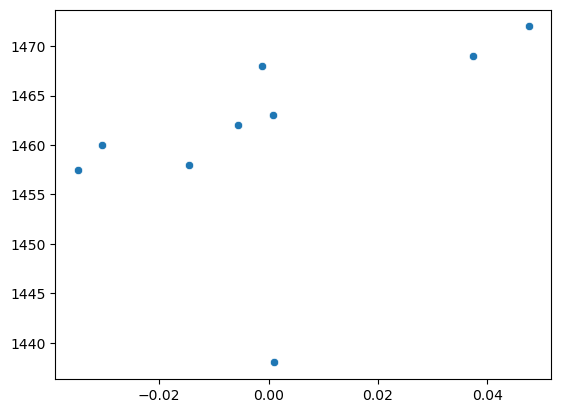

In [3086]:
sns.scatterplot(x=subset['differences'].values, y=lens.Length.values)

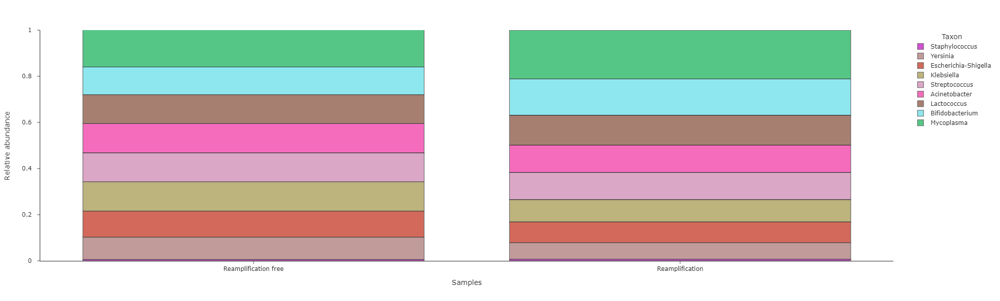

In [1277]:
data = DataFrame({'Reamplification free': dict(zip(long_O.index, np.median(long_O, axis=1))), 
        'Reamplification': dict(zip(long_R.index, np.median(long_R, axis=1)))})
data = data.assign(m=data.mean(axis=1)).sort_values('m').drop('m', axis=1)#[np.sort(data.index)]

import plotly.express as px
fig = px.bar(data.T, 
             x=data.columns, 
             y=data.index,
             width=325, 
             height=600, 
            # color=data_tax_df.index,
             labels={'value': 'Relative abundance', 'index':'Samples'}, 
             template='simple_white',
             color_discrete_map=Color_collection)
fig.update_layout(yaxis_range=[0, 1], legend_title_text='Taxon', legend_title_side='top center')
fig.update_traces(marker_line_width=1.1, marker_line_color='#202020', opacity=0.7)
fig.update_yaxes(ticksuffix = "  ")
#fig.update_xaxes(range=[-0.7, 17.7], autorangeoptions_clipmax=len(data_tax_df.T))
#fig.update_layout(showlegend=False)

fig.write_image(f"VIZ/amplification_bias_v1_v9.pdf")
fig.write_image(f"VIZ/amplification_bias_v1_v9.png", scale=5)
fig.show()

In [2974]:
lens = lens[lens.Length > 0]

array([ 0.00104273, -0.03487091, -0.01448169, -0.03048395, -0.00557894,
        0.00082505, -0.00128014,  0.03729801,  0.04752982])

In [2986]:
long_R.median(axis=1)

s__Candida_sp                   0.000000
s__Candida_africana             0.000000
s__Meyerozyma_caribbica         0.000000
s__Candida_orthopsilosis        0.000000
s__Fungi_sp                     0.000000
s__Candida_auris                0.000000
s__Meyerozyma_sp                0.000000
s__Rhodotorula_sp               0.001910
s__Kluyveromyces_marxianus      0.009080
s__Meyerozyma_guilliermondii    0.038638
s__Rhodotorula_mucilaginosa     0.047245
s__Candida_tropicalis           0.052131
s__Candida_parapsilosis         0.055672
s__Candida_albicans             0.064605
s__Issatchenkia_orientalis      0.127203
s__Clavispora_lusitaniae        0.151881
s__Clavispora_sp                0.146930
s__Yarrowia_lipolytica          0.297745
dtype: float64

In [2987]:
from scipy import stats
def geom_signif(data, max, ax):
    
    # Initialise a list of combinations of groups that are significantly different
    significant_combinations = []
    # Check from the outside pairs of boxes inwards
    ls = list(range(1, len(data) + 1))
    combinations = [(ls[x], ls[x + y]) for y in reversed(ls) for x in range((len(ls) - y))]
    print(combinations)
    for combination in combinations:
        data1 = data[combination[0] - 1]
        data2 = data[combination[1] - 1]
        # Significance
        U, p = stats.mannwhitneyu(data1, data2, alternative='two-sided')
        #if p < 0.05:
        significant_combinations.append([combination, p])
    
    #print(significant_combinations)
    bottom, top = [0, max]
    y_range = top - bottom
    # Significance bars
    for i, significant_combination in enumerate(significant_combinations):
        # Columns corresponding to the datasets of interest
        x1 = significant_combination[0][0]-1
        x2 = significant_combination[0][1]-1
        # What level is this bar among the bars above the plot?
        level = len(significant_combinations) - i
        # Plot the bar
        bar_height = (y_range * 0.1 * level) + top
        bar_tips = bar_height - (y_range * 0.02)
        ax.plot(
            [x1, x1, x2, x2],
            [bar_tips, bar_height, bar_height, bar_tips], lw=1, c='k'
        )
        # Significance level
        p = significant_combination[1]

        if p < 0.001:
            sig_symbol = '***'
        elif p < 0.01:
            sig_symbol = '**'
        elif p < 0.05:
            sig_symbol = '*'
        elif p > 0.05:
            sig_symbol = 'NS.'
        text_height = bar_height + (y_range * 0.01)

        ax.text((x1 + x2) * 0.5, text_height, sig_symbol, ha='center', va='bottom', c='k')

In [2988]:
long_R

,ITS1_5.8_ITS2_R1,ITS1_5.8_ITS2_R2,ITS1_5.8_ITS2_R3
s__Candida_sp,0.000000,0.000000,0.001015
s__Candida_africana,0.000000,0.000000,0.000000
s__Meyerozyma_caribbica,0.000000,0.000000,0.001254
s__Candida_orthopsilosis,0.000000,0.000000,0.000000
s__Fungi_sp,0.000000,0.000000,0.000000
s__Candida_auris,0.000000,0.000000,0.000000
s__Meyerozyma_sp,0.000000,0.000000,0.001313
s__Rhodotorula_sp,0.002193,0.000000,0.001910
s__Kluyveromyces_marxianus,0.009080,0.008781,0.009254
s__Meyerozyma_guilliermondii,0.046476,0.038638,0.035045


SignificanceResult(statistic=0.3039459971317179, pvalue=0.2201134030122297)


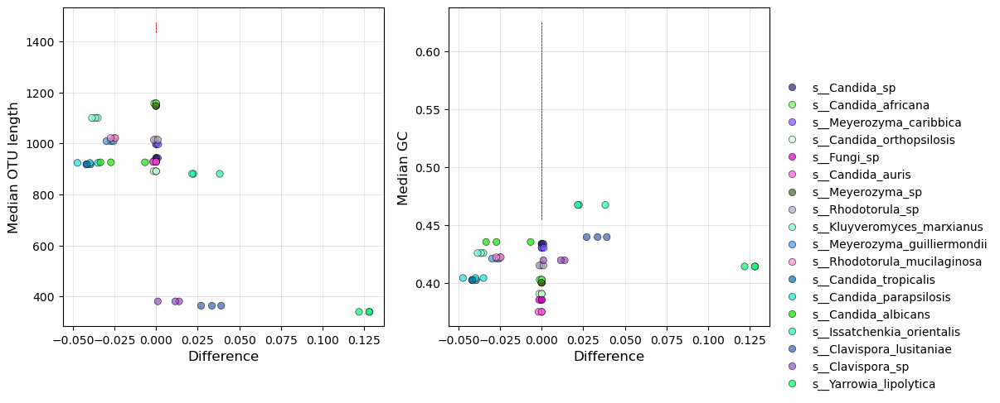

In [2990]:
fig, axs = plt.subplots(1, 2, figsize=(11, 5))

for pair in range(3):

    y = (long_R[long_R.columns[pair]] - long_O[long_O.columns[pair]]).loc[long.index].values
    x = lens.Length.loc[long.index].values
    
    sns.scatterplot(x=y, y=x, hue=long.index,# color='black',
               edgecolor='black', linewidth=.5, palette=Color_collection, alpha=.7, ax=axs[0], legend=False)
    axs[0].plot([0, 0], [1435, 1475], color='red', linewidth=0.5, linestyle='dashed')
   # axs[0].set_ylim(1435, 1475)

#for i, txt in enumerate(lens.index):
    
 #   plt.annotate(txt, (x[i]+11, y[i]+0.001), fontsize=5)
axs[0].set_ylabel('Median OTU length', fontsize=12)
axs[0].set_xlabel('Difference', fontsize=12)
axs[0].grid(alpha=.1, color='black')
#sns.despine(offset=10, trim=True)

for pair in range(3):
    
    y = (long_R[long_R.columns[pair]] - long_O[long_O.columns[pair]]).loc[long.index].values
    x = gc.GC.loc[long.index].values
    
    if pair == 1:
        
        sns.scatterplot(x=y, y=x, hue=long.index,# color='black',
                   edgecolor='black', linewidth=.5, palette=Color_collection, alpha=.7, ax=axs[1])
    else:
        sns.scatterplot(x=y, y=x, hue=long.index,# color='black',
                   edgecolor='black', linewidth=.5, palette=Color_collection, alpha=.7, ax=axs[1], legend=False)
        
    axs[1].plot([0, 0], [0.455, 0.625], color='red', linewidth=0.5, linestyle='dashed')
    #axs[1].set_ylim(0.455, 0.625)

#for i, txt in enumerate(lens.index):
    
#    axs[1].annotate(txt, (x[i]+11, y[i]+0.001), fontsize=5)
axs[1].set_ylabel('Median GC', fontsize=12)
axs[1].set_xlabel('Difference', fontsize=12)
axs[1].grid(alpha=.1, color='black')
axs[1].legend(#loc='center left', 
           bbox_to_anchor=(1, .8), 
           frameon=False, 
           #framealpha=1, 
           #borderpad=0.8, 
           fontsize=10)

from scipy.stats import spearmanr

print(spearmanr(x, y))
#plt.xscale('log')
#plt.yscale('log')
plt.savefig('VIZ/Difference_its.pdf', bbox_inches='tight')
plt.savefig('VIZ/Difference_its.png', dpi=800, bbox_inches='tight')
#plt.savefig('VIZ/Difference_v1-v9.pdf', bbox_inches='tight')
#plt.savefig('VIZ/Difference_v1-v9.png', dpi=800, bbox_inches='tight')

In [1160]:
[x[y<0], x[y>0]]

[array([0.42577778, 0.42099857, 0.42211055, 0.40246637, 0.40421456,
        0.43531385]),
 array([0.46727882, 0.43956044, 0.41952507, 0.41420118])]

SignificanceResult(statistic=0.27131695418995544, pvalue=0.2761305770801452)


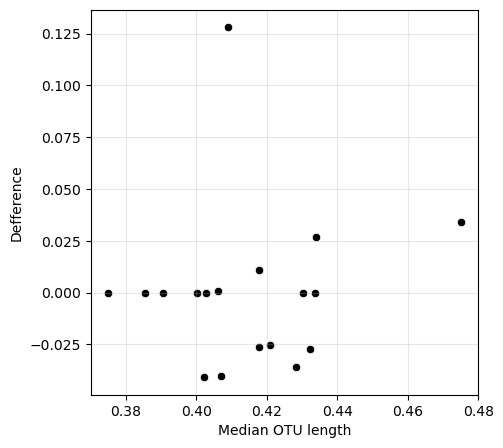

In [859]:
plt.figure(figsize=(5, 5))
y = (long_R.median(axis=1) - long_O.median(axis=1))[lens.index].values
x = gc.GC.values

plt.scatter(x, y, color='black',
           edgecolor='white', linewidth=.5)
#plt.plot([300, 1200], [0, 0], color='red', linewidth=0.5, linestyle='dashed')
#plt.xlim(300, 1200)

for i, txt in enumerate(lens.index):
    
    plt.annotate(txt, (x[i]+10, y[i]+0.003), fontsize=7)
plt.xlabel('Median ')
plt.ylabel('Defference')
plt.grid(alpha=.3)

from scipy.stats import spearmanr

print(spearmanr(x, y))
#plt.xscale('log')
#plt.yscale('log')

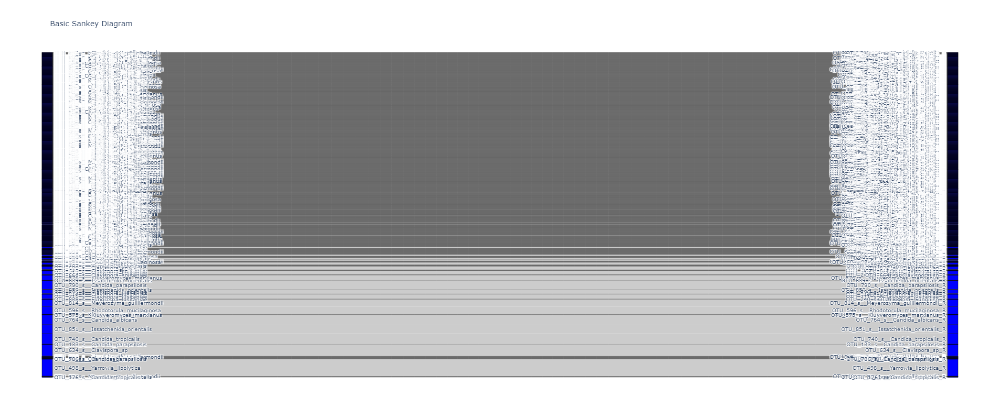

In [667]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = np.concatenate([long_O.index, np.array([i+"_R" for i in long_O.index])]),
      color = "blue"
    ),
    link = dict(
      source = list(range(len(long_O.index))), # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = list(range(len(long_O.index), len(long_O.index)*2)),
      value = np.concatenate([np.median(long_O, axis=1), np.median(long_R, axis=1)])
  ))])

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10,
    autosize=False,
    width=800,
    height=800,)
fig.show()

In [294]:
np.median(long_O, axis=1)

array([0.00102255, 0.00103078, 0.00102255, 0.00103078, 0.00103078,
       0.00102255, 0.00103078, 0.00102255, 0.00102255, 0.00102255,
       0.00102255, 0.00102255, 0.07328773, 0.04621061, 0.00235294,
       0.06582992, 0.0927516 , 0.12582684, 0.09399677, 0.13700123,
       0.09682971, 0.09394669, 0.17052204])

In [295]:
np.median(long_R, axis=1)

array([0.00103844, 0.00103844, 0.00106263, 0.00103844, 0.00103844,
       0.00103844, 0.00103844, 0.00106263, 0.00103844, 0.00103844,
       0.00103844, 0.00106263, 0.04824198, 0.01011013, 0.00293897,
       0.03964462, 0.06557472, 0.15280622, 0.12808255, 0.14783836,
       0.05666328, 0.05312377, 0.29852066])

## GET ENTROPY

In [816]:
def get_entrops(positions):

    regions = np.linspace(0, len(positions), 101)
    ent_val = []
    
    for pos in range(len(regions)-1):
        
        vals = []
        
        for idx in range(round(regions[pos]), round(regions[pos+1])):
            
            vals.append(list(positions[idx].values()))
            
           # print(idx)
          #  break
         #   positions()
        vals = np.array(vals)
       # ent_val.append(entropy(np.sum(vals, axis=0)))
        ent_val.append(np.mean(entropy(vals, axis=1)))
        
        
        #break
    return ent_val

In [815]:
entropy(vals, axis=1)

array([0.22727794, 0.        , 0.00145712, 0.26489452, 0.00145712,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.3568095 , 0.63679821, 0.66961534, 0.29317706, 0.12403766,
       0.06990946, 0.03013813, 0.0127684 , 0.00659028, 0.00416548])

In [817]:
all_data = {}
for samp in tqdm(listdir('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V3_V4_final_version/work_dir/')):
    all_data[samp] = []
    entr_all = []
    pos_raw = []
    
    for seq in tqdm(listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V3_V4_final_version/work_dir/{samp}/msa/')):
        
        opn_msa = parse(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V3_V4_final_version/work_dir/{samp}/msa/{seq}', 'fasta')
        positions = {}
        
        for line in opn_msa:
            
            for posit,letter in enumerate(str(line.seq)):
                
                if posit not in positions:
                    
                    positions[posit] = {'A': 0,
                                        'T' : 0,
                                        'G' : 0,
                                        'C' : 0,
                                        '-' : 0 }
                
                #if '-' in letter: continue
    
                positions[posit][letter.upper()] += 1
        pos_raw.append(positions)
        entr_all.append(get_entrops(positions))
        
    all_data[samp].append([pos_raw, entr_all])

100%|███████████████████████████████████████████████████████████████████████| 6/6 [11:46<00:00, 117.79s/it]


In [818]:
all_data['V3_V4_R2'][0][1]

[[0.22527051682996935,
  0.12354459795067227,
  0.48637421794104885,
  0.19044832657442332,
  0.1627775496133367,
  0.06508280342154962,
  0.1299541712916575,
  0.108383240889482,
  0.05867574764073835,
  0.0,
  0.16063431312012222,
  0.1209442899851122,
  0.08037001544792155,
  0.17622465835086715,
  0.18841596582078016,
  0.12984845351593663,
  0.09039278252993004,
  0.12354459795067227,
  0.22529172787861446,
  0.1390457630886599,
  0.11713754216986098,
  0.06697501287326796,
  0.1236528332865671,
  0.2707177822104744,
  0.27978628253557913,
  0.08037001544792156,
  0.4696531030030802,
  0.3276935599889862,
  0.15782284827956522,
  0.11692358905824529,
  0.300333856029999,
  0.13220564312076682,
  0.10836562126019518,
  0.02169426780718321,
  0.07147632367774023,
  0.06679671861358821,
  0.09544327436267779,
  0.21482171752997462,
  0.30455503792428856,
  0.2184385195188739,
  0.41876199074345005,
  0.21863641954569496,
  0.08015606233630586,
  0.10847133903591603,
  0.1605260777842

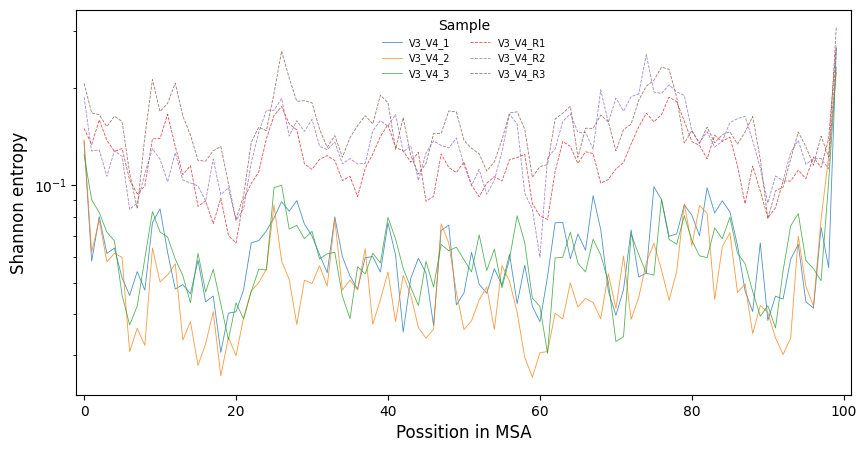

In [819]:
plt.figure(figsize=(10, 5))

for samp in np.sort(list(all_data.keys())):
    
    color='green'
    linestyle = 'solid'
    
    if 'R' in samp: 
        color='red' 
        linestyle = 'dashed'
    
    
  #  for i in all_data[samp][0][1]:
   #     plt.plot(i, linewidth=.3, c=color)
    sns.lineplot(np.mean(np.array(all_data[samp][0][1]), axis=0), 
                linewidth=.6, 
                linestyle=linestyle, 
                label=samp, alpha=0.8)

plt.yscale('log')
plt.ylabel('Shannon entropy', fontsize=12)
plt.xlabel('Possition in MSA', fontsize=12)
plt.xlim(-1, len(np.mean(np.array(all_data[samp][0][1]), axis=0))+1)
plt.legend(loc='best', fontsize=7, ncol=2, title='Sample', frameon=False)
#plt.xticks(np.linspace(0, 150, 7), [round(i) for i in np.linspace(0, len(positions), 7)])
plt.show()

In [820]:
all_data_long = {}
for samp in tqdm(listdir('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V1_V9_final_version/work_dir/')):
    all_data_long[samp] = []
    entr_all = []
    pos_raw = []
    
    for seq in tqdm(listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V1_V9_final_version/work_dir/{samp}/msa/')):
        
        opn_msa = parse(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V1_V9_final_version/work_dir/{samp}/msa/{seq}', 'fasta')
        positions = {}
        
        for line in opn_msa:
            
            for posit,letter in enumerate(str(line.seq)):
                
                if posit not in positions:
                    
                    positions[posit] = {'A': 0,
                                        'T' : 0,
                                        'G' : 0,
                                        'C' : 0,
                                        '-' : 0 }
                
                #if '-' in letter: continue
    
                positions[posit][letter.upper()] += 1
        pos_raw.append(positions)
        entr_all.append(get_entrops(positions))
        
    all_data_long[samp].append([pos_raw, entr_all])

100%|████████████████████████████████████████████████████████████████████████| 6/6 [01:27<00:00, 14.53s/it]


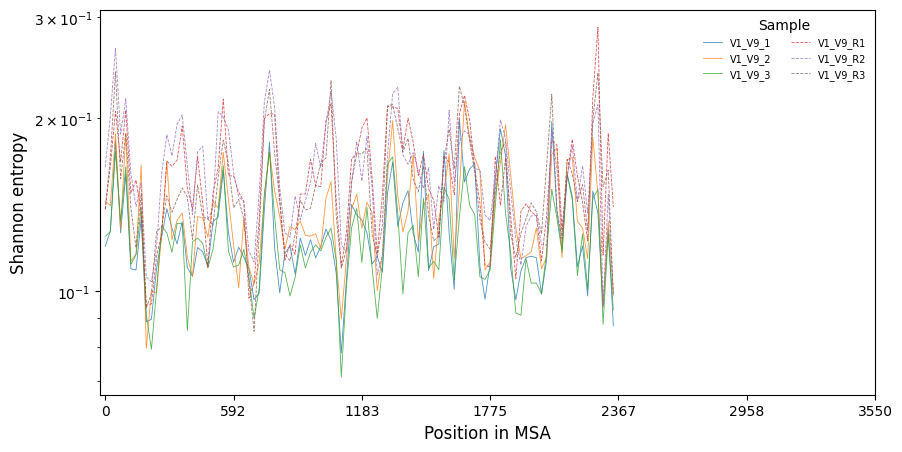

In [821]:
plt.figure(figsize=(10, 5))

for samp in np.sort(list(all_data_long.keys())):
    
    color='green'
    linestyle = 'solid'
    
    if 'R' in samp: 
        color='red' 
        linestyle = 'dashed'
    
    
  #  for i in all_data[samp][0][1]:
   #     plt.plot(i, linewidth=.3, c=color)
    sns.lineplot(np.mean(np.array(all_data_long[samp][0][1]), axis=0), 
                linewidth=.6, 
                linestyle=linestyle, 
                label=samp, alpha=0.8)

plt.yscale('log')
plt.ylabel('Shannon entropy', fontsize=12)
plt.xlabel('Position in MSA', fontsize=12)
plt.xlim(-1, len(np.mean(np.array(all_data_long[samp][0][1]), axis=0))+1)
plt.legend(loc='best', fontsize=7, ncol=2, title='Sample', frameon=False)
plt.xticks(np.linspace(0, 150, 7), [round(i) for i in np.linspace(0, len(positions), 7)])
plt.show()

In [822]:
all_data_its1 = {}
for samp in tqdm(listdir('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS1_final_version//work_dir/')):
    all_data_its1[samp] = []
    entr_all = []
    pos_raw = []
    
    for seq in tqdm(listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS1_final_version//work_dir/{samp}/msa/')):
        
        opn_msa = parse(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS1_final_version//work_dir/{samp}/msa/{seq}', 'fasta')
        positions = {}
        
        for line in opn_msa:
            
            for posit,letter in enumerate(str(line.seq)):
                
                if posit not in positions:
                    
                    positions[posit] = {'A': 0,
                                        'T' : 0,
                                        'G' : 0,
                                        'C' : 0,
                                        '-' : 0 }
                
                #if '-' in letter: continue
    
                positions[posit][letter.upper()] += 1
        pos_raw.append(positions)
        entr_all.append(get_entrops(positions))
        
    all_data_its1[samp].append([pos_raw, entr_all])

100%|████████████████████████████████████████████████████████████████████████| 6/6 [01:28<00:00, 14.69s/it]


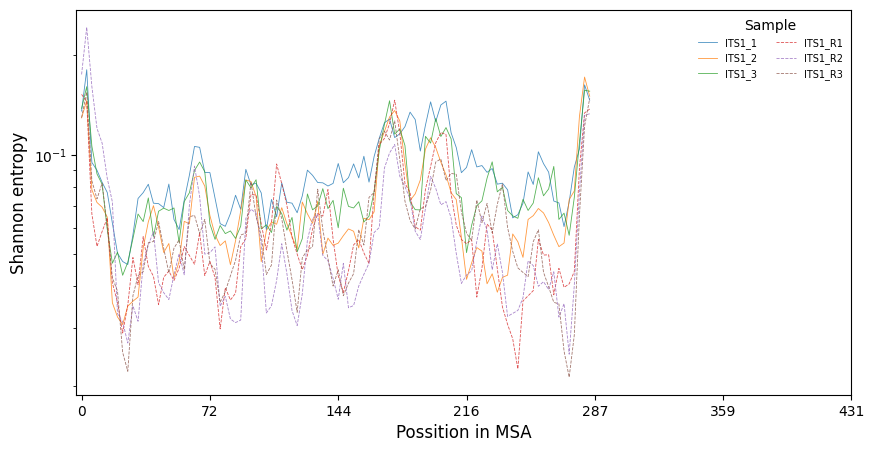

In [823]:
plt.figure(figsize=(10, 5))

for samp in np.sort(list(all_data_its1.keys())):
    
    color='green'
    linestyle = 'solid'
    
    if 'R' in samp: 
        color='red' 
        linestyle = 'dashed'
    
    
  #  for i in all_data[samp][0][1]:
   #     plt.plot(i, linewidth=.3, c=color)
    sns.lineplot(np.mean(np.array(all_data_its1[samp][0][1]), axis=0), 
                linewidth=.6, 
                linestyle=linestyle, 
                label=samp, alpha=0.8)

plt.yscale('log')
plt.ylabel('Shannon entropy', fontsize=12)
plt.xlabel('Possition in MSA', fontsize=12)
plt.xlim(-1, len(np.mean(np.array(all_data_its1[samp][0][1]), axis=0))+1)
plt.legend(loc='best', fontsize=7, ncol=2, title='Sample', frameon=False)
plt.xticks(np.linspace(0, 150, 7), [round(i) for i in np.linspace(0, len(positions), 7)])
plt.show()

In [824]:
all_data_its2 = {}
for samp in tqdm(listdir('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS2_final_version//work_dir/')):
    all_data_its2[samp] = []
    entr_all = []
    pos_raw = []
    
    for seq in tqdm(listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS2_final_version//work_dir/{samp}/msa/')):
        
        opn_msa = parse(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS2_final_version//work_dir/{samp}/msa/{seq}', 'fasta')
        positions = {}
        
        for line in opn_msa:
            
            for posit,letter in enumerate(str(line.seq)):
                
                if posit not in positions:
                    
                    positions[posit] = {'A': 0,
                                        'T' : 0,
                                        'G' : 0,
                                        'C' : 0,
                                        '-' : 0 }
                
                #if '-' in letter: continue
    
                positions[posit][letter.upper()] += 1
        pos_raw.append(positions)
        entr_all.append(get_entrops(positions))
        
    all_data_its2[samp].append([pos_raw, entr_all])

100%|████████████████████████████████████████████████████████████████████████| 6/6 [00:37<00:00,  6.28s/it]


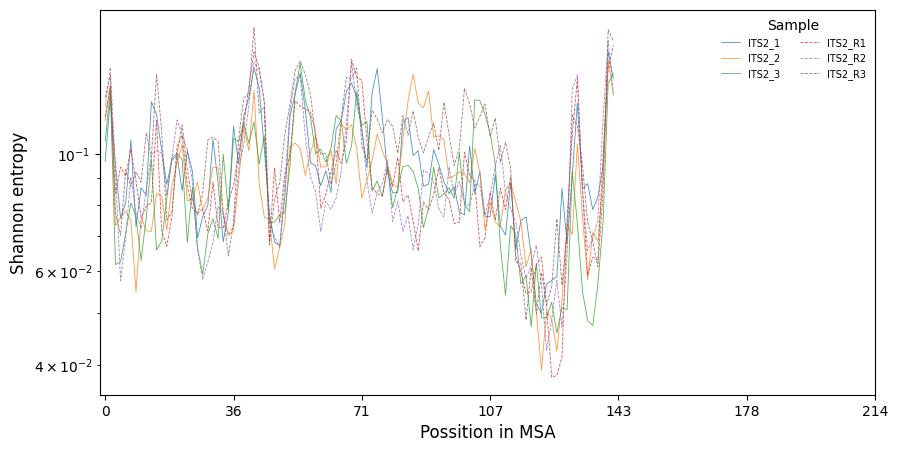

In [825]:
plt.figure(figsize=(10, 5))

for samp in np.sort(list(all_data_its2.keys())):
    
    color='green'
    linestyle = 'solid'
    
    if 'R' in samp: 
        color='red' 
        linestyle = 'dashed'
    
    
  #  for i in all_data[samp][0][1]:
   #     plt.plot(i, linewidth=.3, c=color)
    sns.lineplot(np.mean(np.array(all_data_its2[samp][0][1]), axis=0), 
                linewidth=.6, 
                linestyle=linestyle, 
                label=samp, alpha=0.8)

plt.yscale('log')
plt.ylabel('Shannon entropy', fontsize=12)
plt.xlabel('Possition in MSA', fontsize=12)
plt.xlim(-1, len(np.mean(np.array(all_data_its2[samp][0][1]), axis=0))+1)
plt.legend(loc='best', fontsize=7, ncol=2, title='Sample', frameon=False)
plt.xticks(np.linspace(0, 150, 7), [round(i) for i in np.linspace(0, len(positions), 7)])
plt.show()

In [826]:
all_data_itsfull = {}
for samp in tqdm(listdir('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS1_5.8_ITS2_final_version//work_dir/')):
    all_data_itsfull[samp] = []
    entr_all = []
    pos_raw = []
    
    for seq in tqdm(listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS1_5.8_ITS2_final_version//work_dir/{samp}/msa/')):
        
        opn_msa = parse(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/ITS1_5.8_ITS2_final_version//work_dir/{samp}/msa/{seq}', 'fasta')
        positions = {}
        
        for line in opn_msa:
            
            for posit,letter in enumerate(str(line.seq)):
                
                if posit not in positions:
                    
                    positions[posit] = {'A': 0,
                                        'T' : 0,
                                        'G' : 0,
                                        'C' : 0,
                                        '-' : 0 }
                
                #if '-' in letter: continue
    
                positions[posit][letter.upper()] += 1
        pos_raw.append(positions)
        entr_all.append(get_entrops(positions))
        
    all_data_itsfull[samp].append([pos_raw, entr_all])

100%|████████████████████████████████████████████████████████████████████████| 6/6 [01:37<00:00, 16.29s/it]


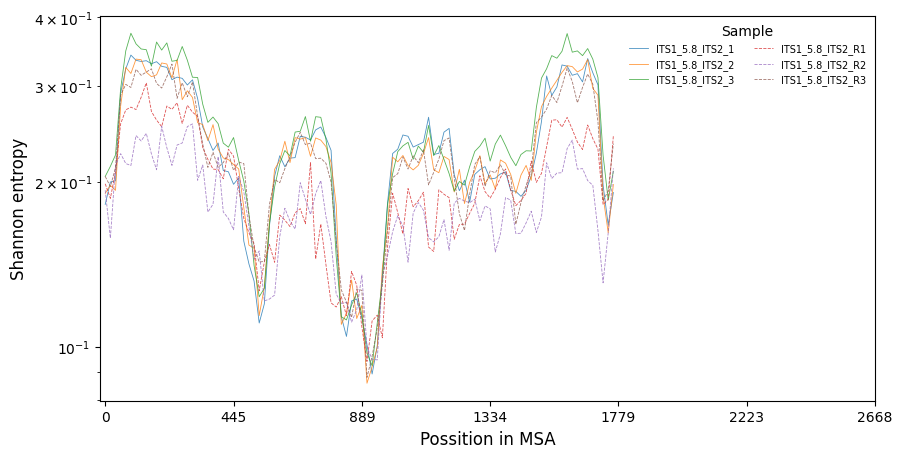

In [827]:
plt.figure(figsize=(10, 5))

for samp in np.sort(list(all_data_itsfull.keys())):
    
    color='green'
    linestyle = 'solid'
    
    if 'R' in samp: 
        color='red' 
        linestyle = 'dashed'
    
    
  #  for i in all_data[samp][0][1]:
   #     plt.plot(i, linewidth=.3, c=color)
    sns.lineplot(np.mean(np.array(all_data_itsfull[samp][0][1]), axis=0), 
                linewidth=.6, 
                linestyle=linestyle, 
                label=samp, alpha=0.8)

plt.yscale('log')
plt.ylabel('Shannon entropy', fontsize=12)
plt.xlabel('Possition in MSA', fontsize=12)
plt.xlim(-1, len(np.mean(np.array(all_data_itsfull[samp][0][1]), axis=0))+1)
plt.legend(loc='best', fontsize=7, ncol=2, title='Sample', frameon=False)
plt.xticks(np.linspace(0, 150, 7), [round(i) for i in np.linspace(0, len(positions), 7)])
plt.show()

In [882]:
def get_entropy_plot(all_data, at, ax, lim):
    
    colors = ['#ACFADF', '#94ADD7', '#7C73C0', '#B3005E', '#E90064', '#FF5F9E']
    dfrs = []
    c = 0
    
    for samp in np.sort(list(all_data.keys())):
        
        color='green'
        linestyle = 'solid'
        
        if 'R' in samp: 
            dfrs = np.mean(np.mean(np.array(all_data[samp][0][1]), axis=0) - np.mean(np.array(all_data[samp[:-2]+samp[-1]][0][1]), axis=0))
            color='red' 
            linestyle = 'dashed'
        
        
      #  for i in all_data[samp][0][1]:
       #     plt.plot(i, linewidth=.3, c=color)
        if 'R' in samp:
            sns.lineplot(np.mean(np.array(all_data[samp][0][1]), axis=0), 
                        linewidth=.85, 
                        linestyle=linestyle,
                        label=samp,
                        #label=f'{samp} (AD = {np.round(dfrs, 2)})', 
                         c=colors[c], ax=ax)
        else:
            sns.lineplot(np.mean(np.array(all_data[samp][0][1]), axis=0), 
                        linewidth=.85, 
                        linestyle=linestyle, 
                        label=f'{samp}', c=colors[c], ax=ax)
        c += 1
    ax.set_yscale('log')
    ax.set_ylabel('Shannon entropy', fontsize=12)
    ax.set_xlabel('Position in MSA', fontsize=12)
    ax.set_xlim(-1, len(np.mean(np.array(all_data[samp][0][1]), axis=0))+1)
    ax.set_ylim(-1, lim)
    
    ax.legend(loc='upper center', fontsize=7, ncol=2, title='Sample', frameon=False)
    #ax.set_xticks(np.linspace(0, 150, 7), [round(i) for i in np.linspace(0, len(positions), 7)])
    ax.set_title(at)
    

In [883]:
samp[:-2]+samp[-1]

'ITS1_5.8_ITS2_3'

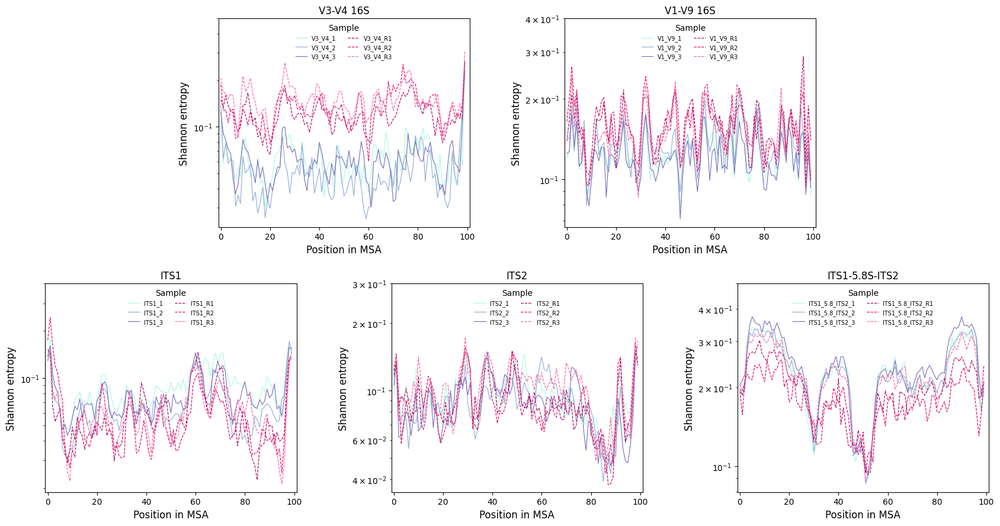

In [884]:
from matplotlib.gridspec import GridSpec
plt.style.use('default')

fig = plt.figure(figsize=(17, 9), layout="constrained")

gs = GridSpec(2, 5, figure=fig)

ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 3])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 2])
ax5 = fig.add_subplot(gs[1, 4])

get_entropy_plot(all_data, 'V3-V4 16S', ax1, lim=0.5)
get_entropy_plot(all_data_long, 'V1-V9 16S', ax2, lim=0.4)
get_entropy_plot(all_data_its1, 'ITS1', ax3, lim=0.4)
get_entropy_plot(all_data_its2, 'ITS2', ax4, lim=0.3)
get_entropy_plot(all_data_itsfull, 'ITS1-5.8S-ITS2', ax5, lim=0.5)
#plt.tight_layout()
plt.tight_layout(w_pad=-16, h_pad=3.5)
plt.savefig('VIZ/MSA_entropy.pdf', bbox_inches='tight')
plt.savefig('VIZ/MSA_entropy.png', bbox_inches='tight', dpi=800)
plt.show()


In [296]:
def get_entropy_plot(all_data, at, ax):

    apf = []
    apf_free = []
    
    for samp in np.sort(list(all_data.keys())):
        
        
        if 'R' not in samp: 
            color='red' 
            linestyle = 'dashed'
            apf_free.append(np.mean(np.array(all_data[samp][0][1]), axis=0))

        else:
            color='green'
            linestyle = 'solid'
            apf.append(np.mean(np.array(all_data[samp][0][1]), axis=0))
 
        
      #  for i in all_data[samp][0][1]:
       #     plt.plot(i, linewidth=.3, c=color)
        
    sns.boxplot(data=np.array(apf), ax=ax, color='red')
    sns.boxplot(data=np.array(apf_free), ax=ax, color='green')
    
    ax.set_yscale('log')
    ax.set_ylabel('Shannon entropy', fontsize=12)
    ax.set_xlabel('Position in MSA', fontsize=12)
 #   ax.set_xlim(-1, len(np.mean(np.array(all_data[samp][0][1]), axis=0))+1)
  #  ax.legend(loc='lower center', fontsize=7, ncol=2, title='Sample', frameon=False)
    ax.set_xticks(np.linspace(0, 150, 7), [round(i) for i in np.linspace(0, len(positions), 7)])
    ax.set_title(at)

/tmp/ipykernel_1230984/170904342.py:19: UserWarning:

The figure layout has changed to tight



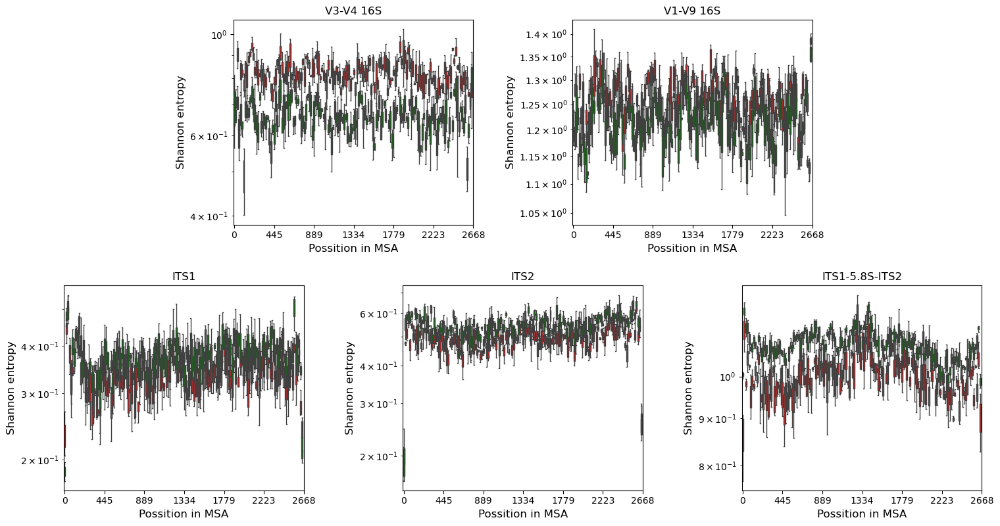

In [2134]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(17*0.9, 9*0.9), layout="constrained")

gs = GridSpec(2, 5, figure=fig)

ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 3])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 2])
ax5 = fig.add_subplot(gs[1, 4])

get_entropy_plot(all_data, 'V3-V4 16S', ax1)
get_entropy_plot(all_data_long, 'V1-V9 16S', ax2)
get_entropy_plot(all_data_its1, 'ITS1', ax3)
get_entropy_plot(all_data_its2, 'ITS2', ax4)
get_entropy_plot(all_data_itsfull, 'ITS1-5.8S-ITS2', ax5)
#plt.tight_layout()
plt.tight_layout(w_pad=-15, h_pad=3.5)

plt.show()


## GET ENTROPY POOL

In [ ]:
pos_raw

In [ ]:
all_data_long = {}
for samp in tqdm(listdir('/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V1_V9_final_version/work_dir/')):
    all_data_long[samp] = []
    entr_all = []
    pos_raw = []
    
    for seq in tqdm(listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V1_V9_final_version/work_dir/{samp}/msa/')):
        
        opn_msa = parse(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/V1_V9_final_version/work_dir/{samp}/msa/{seq}', 'fasta')
        positions = {}
        
        for line in opn_msa:
            
            for posit,letter in enumerate(str(line.seq)):
                
                if posit not in positions:
                    
                    positions[posit] = {'A': 0,
                                        'T' : 0,
                                        'G' : 0,
                                        'C' : 0,
                                        '-' : 0 }
                
                #if '-' in letter: continue
    
                positions[posit][letter.upper()] += 1
        pos_raw.append(positions)
        entr_all.append(get_entrops(positions))
        
    all_data_long[samp].append([pos_raw, entr_all])

In [2208]:
all_cluster_data = {}

for ampt in tqdm(['V3_V4', 'V1_V9', 'ITS1', 'ITS2', 'ITS1_5.8_ITS2']):
    
    all_cluster_data[ampt] = {}
    
    for samp in listdir(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{ampt}_final_version//work_dir/'):
        
        opn_metatab = read_csv(f'/mnt/AsusShareI2/RUNS/runs-krivonos/PIKE_DATA/pike_2023_03_27/{ampt}_final_version//work_dir/{samp}/metadata_df.tsv', sep='\t', index_col=0)
        opn_metatab = opn_metatab[opn_metatab.Clusters != -1]

        all_cluster_data[ampt][samp] = opn_metatab

        

100%|███████████████████████████████████████████████████████████████████| 5/5 [01:04<00:00, 12.84s/it]


In [2228]:
from sklearn.metrics import silhouette_score

#print(silhouette_score(opn_metatab[['1 UMAP COMPONENT', '2 UMAP COMPONENT']], labels=opn_metatab['Clusters']))
def get_umap_plot(opn_metatab, tit, ax):
    
    color_dict_umap = {}
    
    for i in opn_metatab.Clusters.unique():
        
        color_dict_umap[i] = get_color(color_dict_umap)
    sns.scatterplot(opn_metatab, x='1 UMAP COMPONENT', y='2 UMAP COMPONENT',
                    hue='Clusters', s=10, palette=color_dict_umap, legend=False, ax=ax)
   #silh = silhouette_score(opn_metatab[['1 UMAP COMPONENT', '2 UMAP COMPONENT']], labels=opn_metatab['Clusters'])
    
    ax.set_title(f'{tit}', fontsize=12)
    ax.grid(alpha=.4)

In [ ]:
shils = {}

for ampt in tqdm(['V3_V4', 'V1_V9', 'ITS1', 'ITS2', 'ITS1_5.8_ITS2']):
    
    shils[ampt] = {}
    
    for samp in all_cluster_data[ampt].keys():
        shils[ampt][samp] = silhouette_score(all_cluster_data[ampt][samp][['1 UMAP COMPONENT', '2 UMAP COMPONENT']], labels=all_cluster_data[ampt][samp]['Clusters'])

  0%|                                                                           | 0/5 [00:00<?, ?it/s]

In [2227]:
shils

{'V3_V4': {'V3_V4_R2': 0.4200275195427518,
  'V3_V4_2': 0.8626804137749219,
  'V3_V4_R3': 0.46793819227487804,
  'V3_V4_R1': 0.3406412481619036,
  'V3_V4_3': 0.7714944560983931,
  'V3_V4_1': 0.7212142736921874},
 'V1_V9': {'V1_V9_2': 0.8743567676160879,
  'V1_V9_1': 0.8390595030028413,
  'V1_V9_R3': 0.6570628275372743,
  'V1_V9_R2': 0.5936589012989943,
  'V1_V9_3': 0.9019115556205014,
  'V1_V9_R1': 0.5512928310414441},
 'ITS1': {'ITS1_2': 0.40594223951166225,
  'ITS1_R2': 0.2405818326353238,
  'ITS1_R3': 0.18602055734830156,
  'ITS1_R1': 0.22909756520072605,
  'ITS1_1': 0.4633255318140542,
  'ITS1_3': 0.2940434819173444},
 'ITS2': {'ITS2_R1': 0.3690591175206949,
  'ITS2_2': 0.4129340899721891,
  'ITS2_3': 0.3222678154556919,
  'ITS2_1': 0.4464966012739255,
  'ITS2_R3': 0.28920563148017825,
  'ITS2_R2': 0.37419867810252583},
 'ITS1_5.8_ITS2': {'ITS1_5.8_ITS2_R1': 0.3216562877077597,
  'ITS1_5.8_ITS2_R3': 0.5413495527803063,
  'ITS1_5.8_ITS2_R2': 0.5849932328540929,
  'ITS1_5.8_ITS2_2': 

100%|███████████████████████████████████████████████████████████████████| 5/5 [00:04<00:00,  1.13it/s]


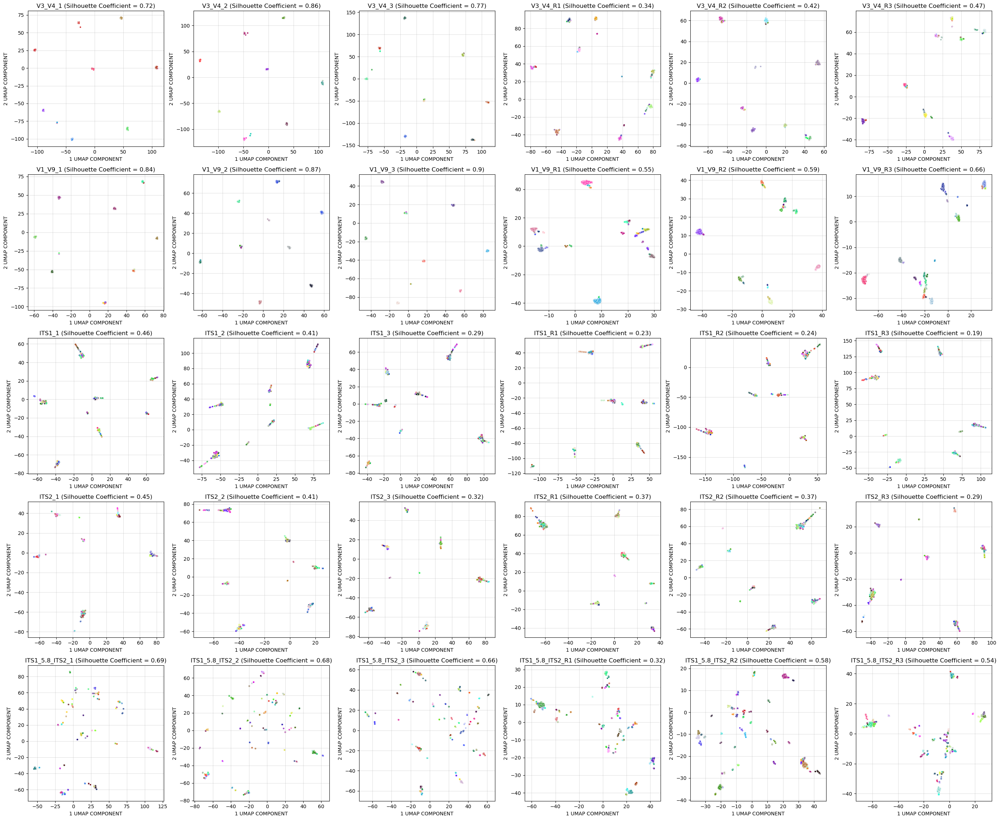

In [2234]:
fig, axs = plt.subplots(5, 6, figsize=(28, 23))
c = 0

for ampt in tqdm(['V3_V4', 'V1_V9', 'ITS1', 'ITS2', 'ITS1_5.8_ITS2']):
    c2 = 0    
    for samp in np.sort(list(all_cluster_data[ampt].keys())):
    
        get_umap_plot(all_cluster_data[ampt][samp], f'{samp} (Silhouette Coefficient = {np.round(shils[ampt][samp], 2)})', axs[c][c2])
        c2 += 1
    c += 1

plt.tight_layout()
plt.savefig('VIZ/Clustering_all.pdf', bbox_inches='tight')
plt.savefig('VIZ/Clustering_all.png', bbox_inches='tight', dpi=800)
plt.show()

MannwhitneyuResult(statistic=178.0, pvalue=0.007016199234239618)


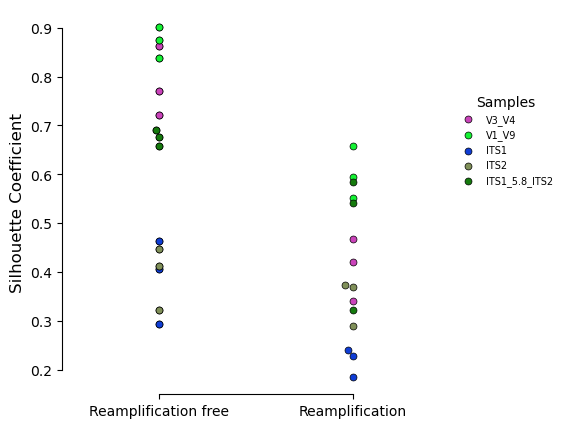

In [2275]:
plt.figure(figsize=(5, 5))
color_dict_samp = {}
originalscall = []    
reampscall = []

for ampt in shils.keys():
    
    originalsc = []
    reampsc = []
    color_dict_samp[ampt] = get_color(color_dict_samp)

    for samp in shils[ampt].keys():
        
        
        if 'R' in samp:
            
            reampsc.append(shils[ampt][samp])
            reampscall.append(shils[ampt][samp])
            continue
        originalsc.append(shils[ampt][samp])
        originalscall.append(shils[ampt][samp])
    sns.swarmplot([originalsc], s=5, color=color_dict_samp[ampt], edgecolor='black', linewidth=.5, label=ampt)
    sns.swarmplot([originalsc, reampsc], s=5, color=color_dict_samp[ampt], edgecolor='black', linewidth=.5)
    
plt.xticks([0, 1], ['Reamplification free', 'Reamplification'])
print(mannwhitneyu(originalscall, reampscall))
plt.ylabel('Silhouette Coefficient', fontsize=12)
plt.legend(fontsize=7, bbox_to_anchor=(1, .8), frameon=False, title='Samples')
sns.despine(trim=True)
plt.savefig('VIZ/Schil_difsamp.pdf', bbox_inches='tight')
plt.savefig('VIZ/Schil_difsamp.png', bbox_inches='tight', dpi=800)
plt.show()

0.41646489759881267

barcode01
barcode02
barcode03
barcode04
barcode05
barcode06


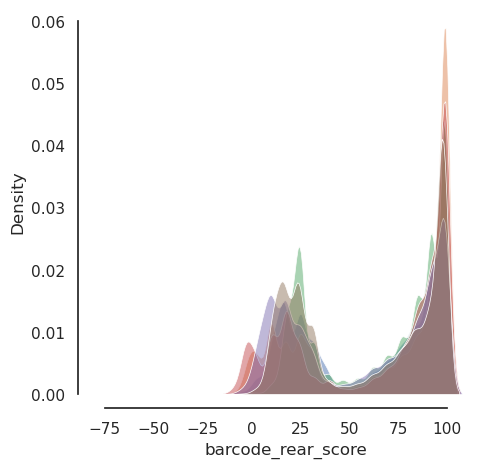

In [125]:
plt.figure(figsize=(5, 5))
for_ridge = {'x' : [], 'sample' : []}
renames = {'barcode01' : 'V3_V4_1',
            'barcode02' : 'V3_V4_2',
            'barcode03' : 'V3_V4_3',
            'barcode04' : 'V3_V4_R1',
            'barcode05' : 'V3_V4_R2',
            'barcode06' : 'V3_V4_R3'}

for barcode in np.sort(summary_run_table['barcode_arrangement'].unique())[:6]:
    print(barcode)
    sns.kdeplot(summary_run_table[summary_run_table['barcode_arrangement'] == barcode]['barcode_rear_score'], linewidth=0.5, multiple="stack", alpha=.5)
    for_ridge['x'].extend(list(summary_run_table[summary_run_table['barcode_arrangement'] == barcode]['barcode_rear_score']))
    for_ridge['sample'].extend(len(list(summary_run_table[summary_run_table['barcode_arrangement'] == barcode]['barcode_rear_score']))*[renames[barcode]])

sns.despine(offset=10, trim=True)
plt.show()

In [127]:
for_ridge_df = DataFrame(for_ridge)

Text(0.5, 33.00000000000014, 'barcode_rear_score')

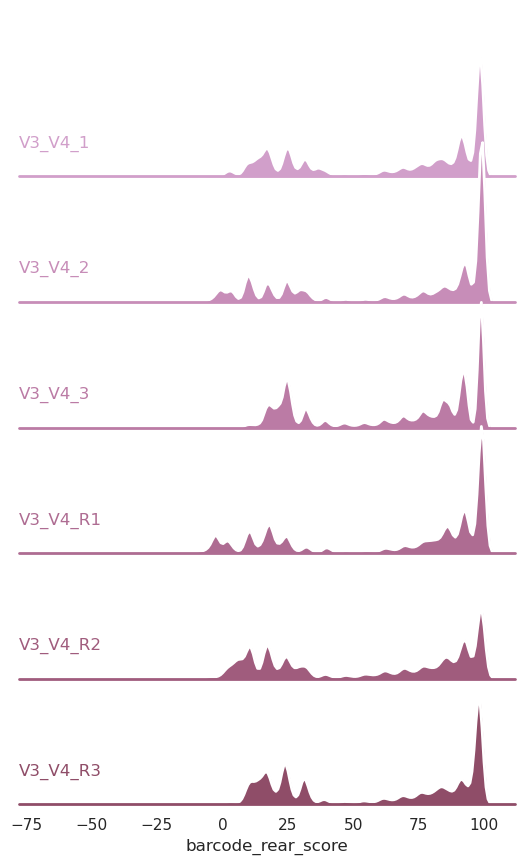

In [134]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings('ignore')
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
# Initialize the FacetGrid object
#pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
pal = sns.cubehelix_palette(10, start=1, rot=-.25, light=.7)

g = sns.FacetGrid(for_ridge_df, row="sample", hue="sample", aspect=4, height=1.5, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "x",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=.5)
g.map(sns.kdeplot, "x", clip_on=False, color="w", lw=2, bw_adjust=.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, color=color,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, "x")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)
plt.xlabel('barcode_rear_score')